In [1]:
import sys
sys.path.append('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/spikeparam/datasets/pvc-6/pvc6_helper_modules/')



from pvc6_stim_analysis import *
from pvc6_load_data import *
from pvc6_plotting import *


%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import h5py
from scipy.stats import pearsonr
from sklearn.model_selection import train_test_split
from spikeparam.patch.fit import Spike, SpikeGroup
from tqdm.notebook import tqdm
import pickle

import seaborn as sns
sns.set(rc={'figure.figsize':(12,9)})
sns.set_style('whitegrid')
sns.set_style("whitegrid", {'axes.grid' : False})

import warnings
warnings.filterwarnings('ignore')

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


#### Data source

These data are the [PVC-6 data from CRCNS](https://crcns.org/data-sets/vc/pvc-6/about_pvc-6). From their summary:

>The data sets consist of whole cell current clamp slice electrophysiology recordings made from single neurons from coronal sections of the visual cortex of adult male mice. The experiments were performed in the presence of blockers of fast synaptic transmission with the goal of understanding the diversity of intrinsic neuronal excitability between cell classes. These experiments represent preliminary datasets being used to refine methods working towards producing slice electrophysiology data at scale.

These data are ideal for several reasons. First, and most critical for us, is that they're sampled at 200,000 Hz! So if we want to parameterize individual action potentials, for a 1ms AP we'll have 200 data points. This is much more approachable than the 20-40 datapoints that have been limiting us on the other datsets.

Second, these are intracellular patch clamp recordings, so they're not susceptible to our concern that extracellular AP shapes are affected by the position of the electrode relative to the neuron, which is not necessaily stable over time (meaning that any observed AP shape differences could theoretically be driven by movement rather than physiology).

Finally, these neurons were driven by 1/f pink noise, which we like a lot. The variability of the 1/f exponent over time will allow us to link stimulus parameters to any variation in AP shape parameters.

### Step 0: Open and load the data

In [2]:
fs = 200000 # sampling rate
one_ms = int(fs / 1000)
total_sweeps = 66
filename = '/Users/blancamartin/Downloads/153098.04.02_data.h5' # filename
f = h5py.File(filename, 'r')

##### Constant current example 

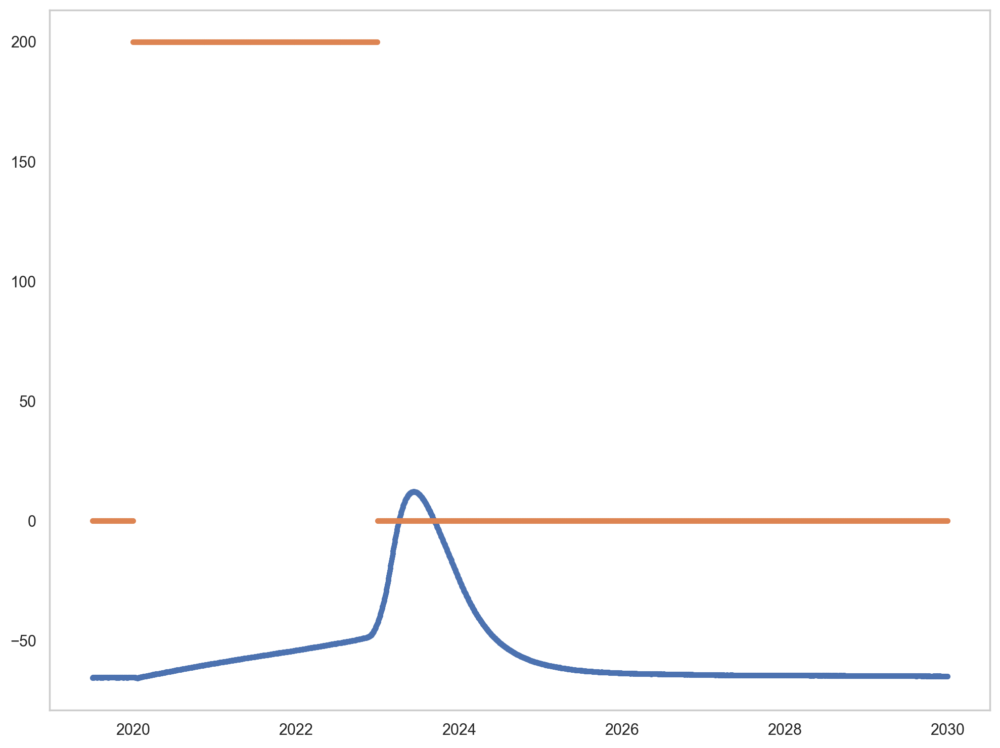

In [3]:
sweep_number = 3
index_start = 403900
index_end = 406000
dset, times = load_sweep(sweep_number, f, fs)
plot_ephys_data(dset, times, index_start, index_end)
plot_stim_data(dset, times, index_start, index_end)
plt.show()

##### Pink noise example 
Pink noise (1/f) stimulation: 
Many of the sweeps are drive by pink noise, and we can leverage the variability in this stimulus to examine the link between variations in the stimulus and AP shape parameters.

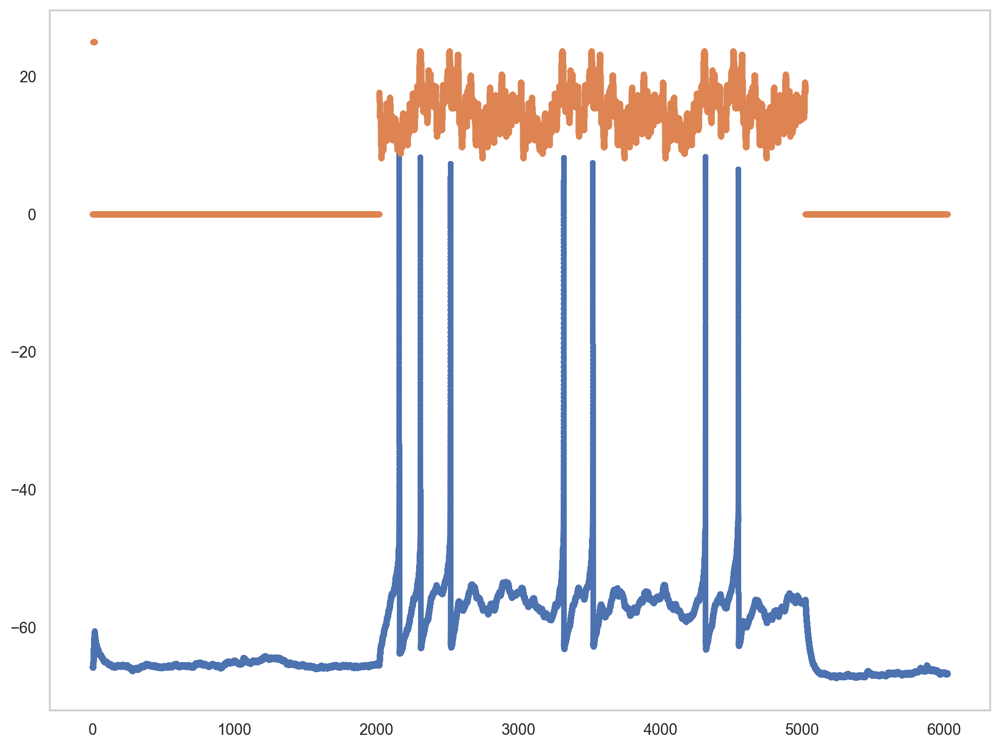

In [4]:
sweep_number = 14
index_start = 0
index_end = int(10e10)
dset, times = load_sweep(sweep_number, f, fs)
plot_ephys_data(dset, times, index_start, index_end)
plot_stim_data(dset, times, index_start, index_end)
plt.show()

### Step 1: Gather stimulation and pink noise stimulation info for each sweep



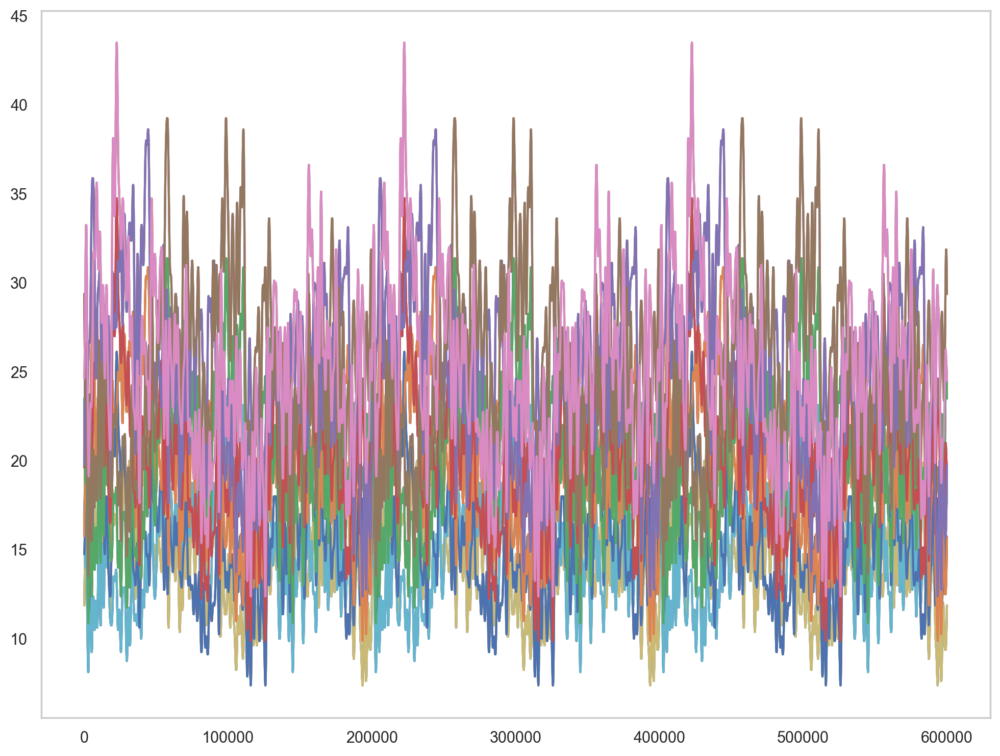

In [5]:
# Process sweeps and extract features
pink_types = process_pink_type_info(f, fs)

### Step 2: Process the data and parameterize complete dataset

The pink noise sweeps all begin with a brief (sub-threshold, always?) stimulus, and then the pink noise stimulus that evokes APs. I use a simple peak-finding approach to find all APs, and then extract time windows around those APs for parameterization of both the APs and the stimulus.

In order to find the inflection point where the AP "starts", we take the difference (~derivative) of the intracellular data around the spike, and find the point where that derivative rises above the noise. This differenced time series is smoothed using simple lowess smoothing, to make things easier.

One cool thing to note here is how similar to an extracelluar AP this derivative of the intracellular AP looks! This probably isn't a coincidence, and has been remarked upon for a very long time. It's worth considering in our future analyses.

In [6]:
# Process sweeps and extract features

"""

df_sweep, df_stim_type, df_spike_number, df_voltage_ramp, df_inflection_time, df_inflection_mv, \
df_peak_amplitude, df_peak_sharpness, df_decay_lambda, df_decay_const, df_stim_exp, df_stim_mean, \
df_stim_std, df_pinktype, all_data, all_times, all_contant_spks, all_ramp_spks, all_pink_spks = process_sweeps(66, f, one_ms, fs, pink_types, load_sweep, find_spike_times, fit_exp_nonlinear)

stim_waveforms = [all_contant_spks, all_ramp_spks, all_pink_spks]

df_stim_features = pd.DataFrame({'sweep': df_sweep, 'stim_type': df_stim_type, 'spike_num': df_spike_number,
                     'stim_exp': df_stim_exp, 'stim_mean': df_stim_mean,
                    'stim_std': df_stim_std,'pink_type':df_pinktype },
        columns=['sweep', 'stim_type', 'spike_num', 'stim_exp', 'stim_mean', 'stim_std', 'pink_type'])
all_data_flat =  [n for one_dim in all_data for n in one_dim]
"""




"\n\ndf_sweep, df_stim_type, df_spike_number, df_voltage_ramp, df_inflection_time, df_inflection_mv, df_peak_amplitude, df_peak_sharpness, df_decay_lambda, df_decay_const, df_stim_exp, df_stim_mean, df_stim_std, df_pinktype, all_data, all_times, all_contant_spks, all_ramp_spks, all_pink_spks = process_sweeps(66, f, one_ms, fs, pink_types, load_sweep, find_spike_times, fit_exp_nonlinear)\n\nstim_waveforms = [all_contant_spks, all_ramp_spks, all_pink_spks]\n\ndf_stim_features = pd.DataFrame({'sweep': df_sweep, 'stim_type': df_stim_type, 'spike_num': df_spike_number,\n                     'stim_exp': df_stim_exp, 'stim_mean': df_stim_mean,\n                    'stim_std': df_stim_std,'pink_type':df_pinktype },\n        columns=['sweep', 'stim_type', 'spike_num', 'stim_exp', 'stim_mean', 'stim_std', 'pink_type'])\nall_data_flat =  [n for one_dim in all_data for n in one_dim]\n"

In [7]:
""""
# Save processed sweeps as pickles
with open('df_stim_features.pkl', 'wb') as file:
    pickle.dump(df_stim_features, file)

with open('all_data.pkl', 'wb') as file:
    pickle.dump(all_data, file)
    
with open('stim_waveforms.pkl', 'wb') as file:
    pickle.dump(stim_waveforms, file)    
    """
    


'"\n# Save processed sweeps as pickles\nwith open(\'df_stim_features.pkl\', \'wb\') as file:\n    pickle.dump(df_stim_features, file)\n\nwith open(\'all_data.pkl\', \'wb\') as file:\n    pickle.dump(all_data, file)\n    \nwith open(\'stim_waveforms.pkl\', \'wb\') as file:\n    pickle.dump(stim_waveforms, file)    \n    '

In [8]:
# Load saved pickles 
with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/df_stim_features.pkl', 'rb') as file:
    df_stim_features = pickle.load(file)

with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/all_data.pkl', 'rb') as file:
    all_data = pickle.load(file)


with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/stim_waveforms.pkl', 'rb') as file:
    stim_waveforms = pickle.load(file)

In [9]:
all_contant_spks, all_ramp_spks, all_pink_spks = stim_waveforms[0], stim_waveforms[1], stim_waveforms[2]

In [10]:
#try collapsing the all data array to 1d (concatenate all sweeps)
all_data_flat =  [n for one_dim in all_data for n in one_dim]

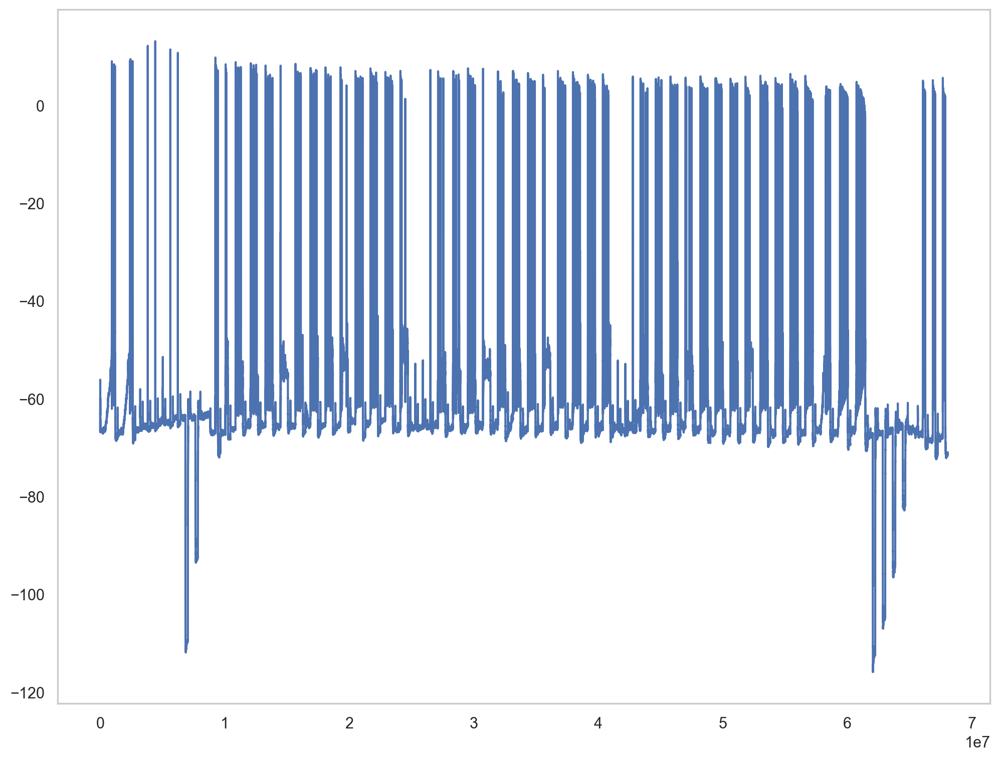

In [11]:
plt.plot(all_data_flat)

#### Plot illustrative example of one spike and its derivative

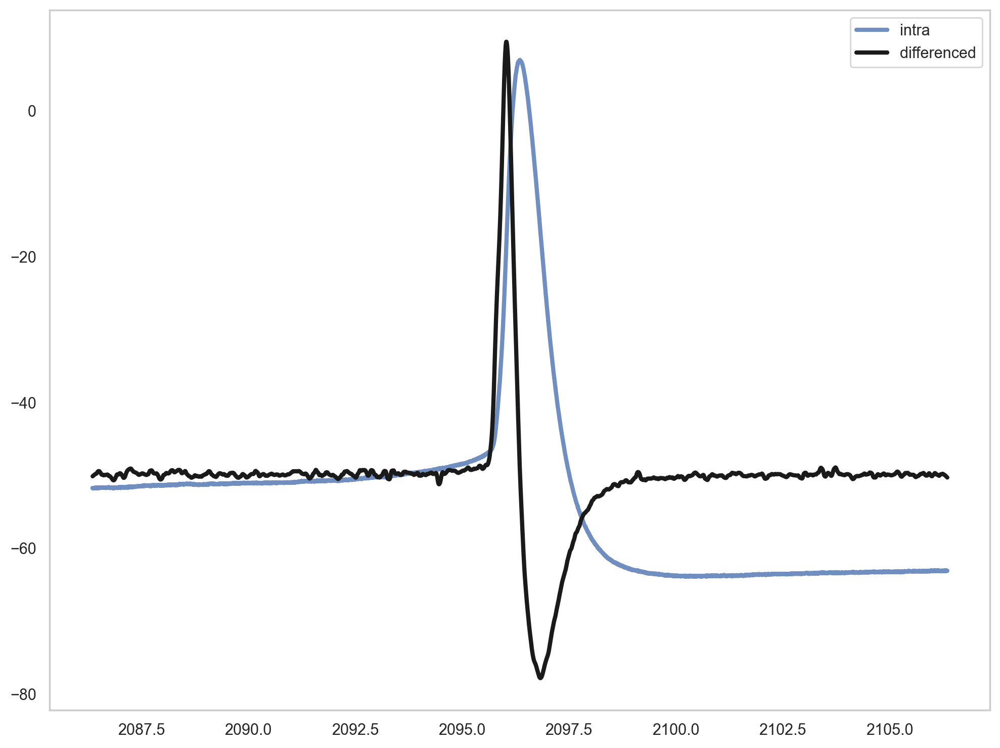

In [12]:
plot_spike_and_derivative(28, f, fs, one_ms)

### Step 3: Use Spike class to fit spikes and extract spike features

In [13]:
sp = Spike(thresh_amp= -10, window_length=(5., 5.), smooth_frac=.008, pre_inflection_ms = 0.5)
sp.fit(all_data_flat, fs, n_jobs=-1, progress=tqdm)

Spike:   0%|          | 0/820 [00:00<?, ?it/s]

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


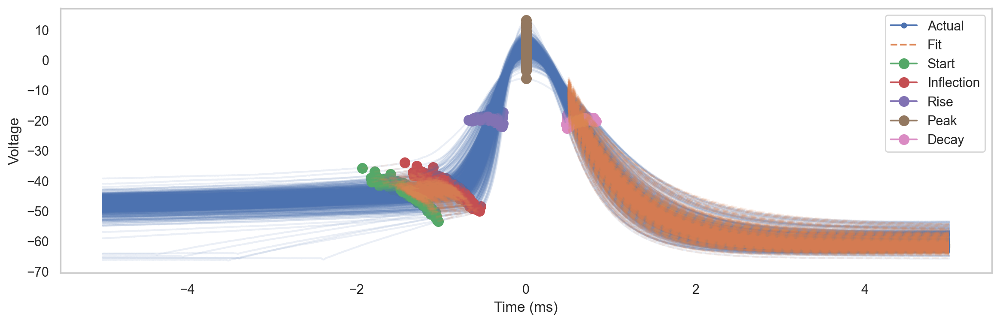

In [14]:
sp.plot(show_points=True)

In [15]:
sp.filter_features()

In [16]:
df_features = sp.df_features

### Step 4: Combine spike fit results with other dataset info (from data processing above)

In [17]:
df = pd.concat([df_stim_features, df_features], axis=1)

#### Plot avg spike waveform for each stim type (for figure)

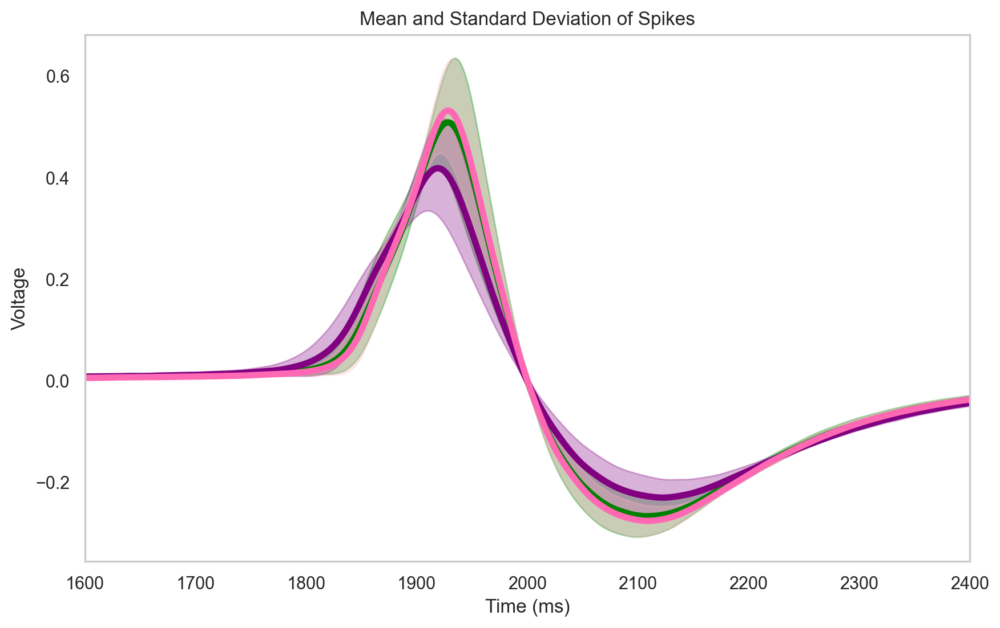

In [18]:
plot_avg_waveform_by_stim_type(all_contant_spks, all_ramp_spks,all_pink_spks)

#### Plot only pink spikes (for figure)

In [19]:
pink_spikes = df[df['stim_type'] == 'pink']

# Get the indices to plot
indices_to_plot = pink_spikes.index.tolist()

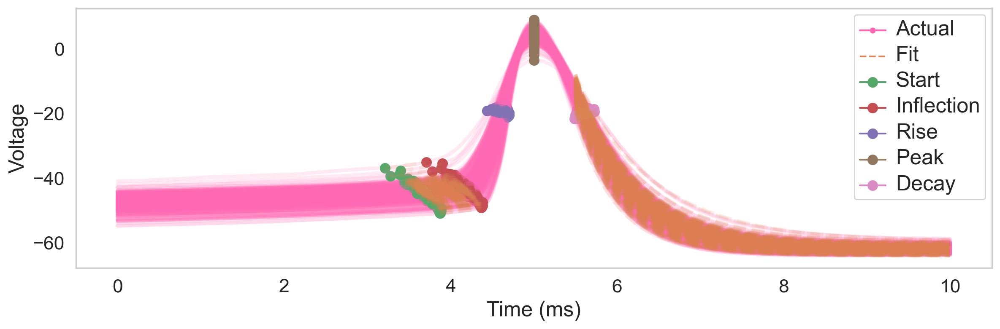

In [20]:
plot_pink_spikes(sp, indices_to_plot)

##### Get indices of last spike for each sweep (these spikes have to be removed later for the ISI predictors)

In [21]:
last_spikes_indices = df.groupby('sweep').tail(1).index
print("Indices of last spikes in each sweep:", last_spikes_indices)

Indices of last spikes in each sweep: Index([  3,   9,  10,  11,  12,  13,  42,  45,  49,  56,  63,  64,  74,  87,
        98, 104, 132, 158, 185, 193, 194, 198, 204, 211, 212, 221, 236, 249,
       255, 279, 305, 331, 357, 358, 364, 371, 379, 385, 401, 416, 431, 441,
       470, 499, 529, 563, 577, 631, 722, 735, 769, 819],
      dtype='int64')


### Step 5: Compute and plot correlations maps (3 versions: all spikes, all spikes under pink stim, first spikes under pink stim)

#### ALL SPIKES

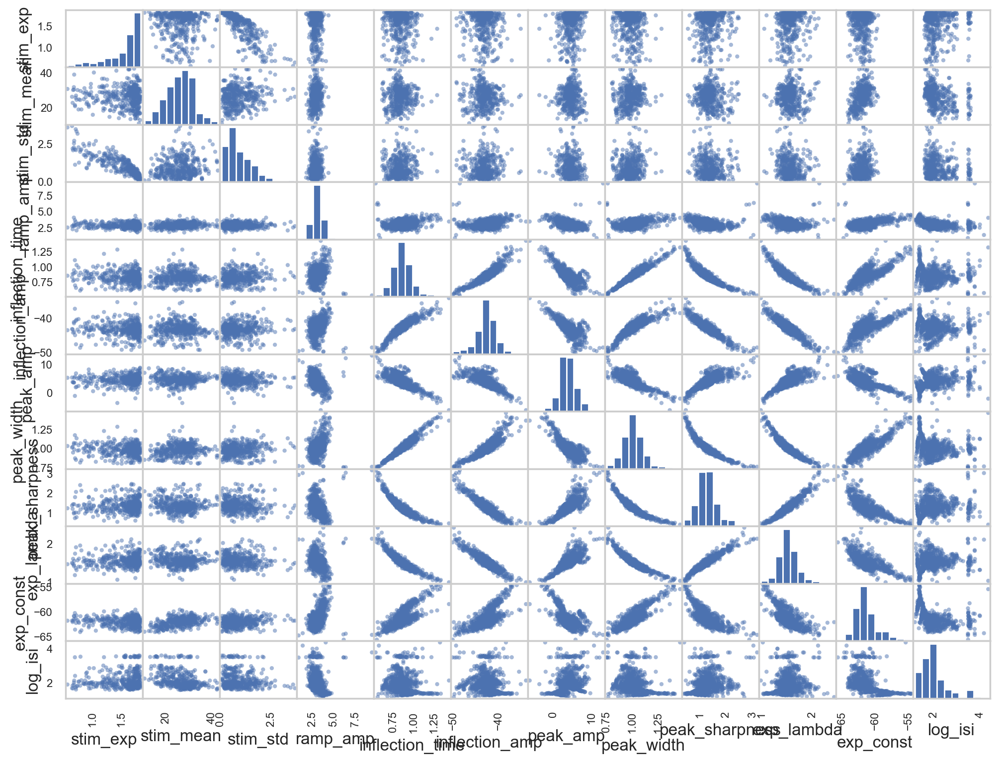

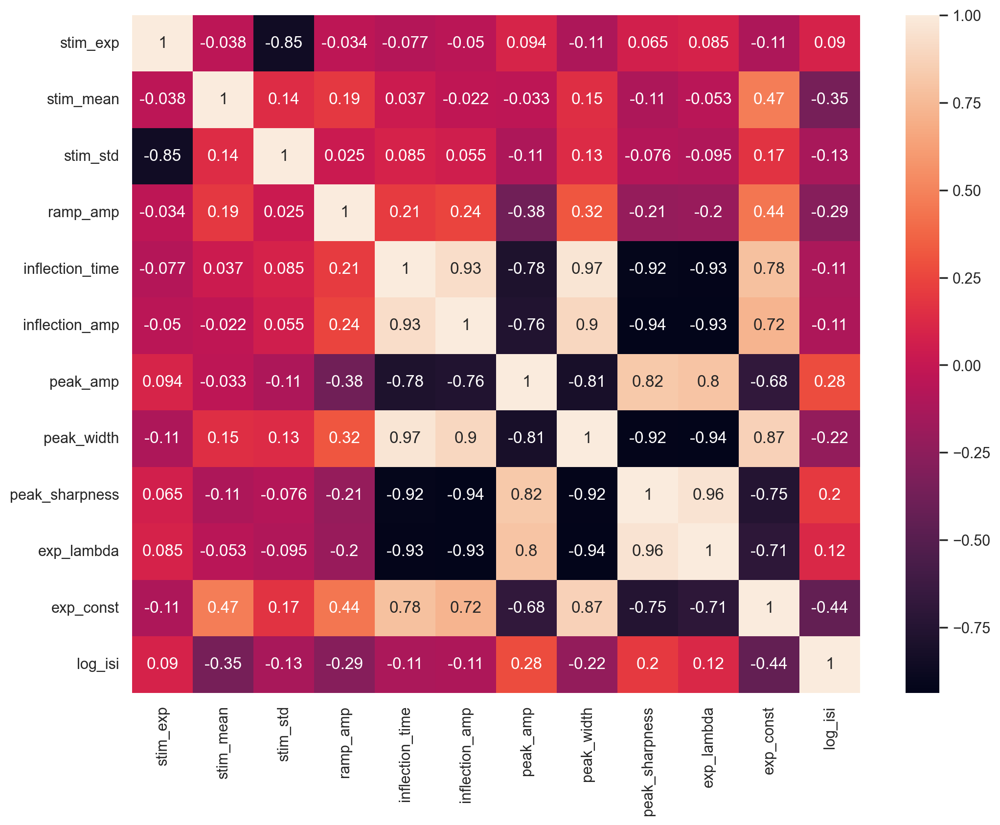

,stim_exp,stim_mean,stim_std,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi
stim_exp,1.0***,-0.04,-0.85***,-0.03,-0.08,-0.05,0.09,-0.11*,0.07,0.09,-0.11*,0.09
stim_mean,-0.04,1.0***,0.14**,0.19***,0.04,-0.02,-0.03,0.15**,-0.11*,-0.05,0.47***,-0.35***
stim_std,-0.85***,0.14**,1.0***,0.02,0.09,0.06,-0.11*,0.13**,-0.08,-0.1,0.17***,-0.13**
ramp_amp,-0.03,0.19***,0.02,1.0***,0.21***,0.24***,-0.38***,0.32***,-0.21***,-0.2***,0.44***,-0.29***
inflection_time,-0.08,0.04,0.09,0.21***,1.0***,0.93***,-0.78***,0.97***,-0.92***,-0.93***,0.78***,-0.11**
inflection_amp,-0.05,-0.02,0.06,0.24***,0.93***,1.0***,-0.76***,0.9***,-0.94***,-0.93***,0.72***,-0.11**
peak_amp,0.09,-0.03,-0.11*,-0.38***,-0.78***,-0.76***,1.0***,-0.81***,0.82***,0.8***,-0.68***,0.28***
peak_width,-0.11*,0.15**,0.13**,0.32***,0.97***,0.9***,-0.81***,1.0***,-0.92***,-0.94***,0.87***,-0.22***
peak_sharpness,0.07,-0.11*,-0.08,-0.21***,-0.92***,-0.94***,0.82***,-0.92***,1.0***,0.96***,-0.75***,0.2***
exp_lambda,0.09,-0.05,-0.1,-0.2***,-0.93***,-0.93***,0.8***,-0.94***,0.96***,1.0***,-0.71***,0.12***


In [22]:
df_all = df.drop(['sweep', 'stim_type', 'pink_type', 'spike_num'], axis=1)
pd.plotting.scatter_matrix(df_all, alpha=0.5)
plt.show()
spikes_corr = df_all.corr()
sns.heatmap(spikes_corr, xticklabels=spikes_corr.columns, yticklabels=spikes_corr.columns, annot=True)
plt.show()
rho = df_all.corr()
pval = df_all.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

#### ALL PINK SPIKES 

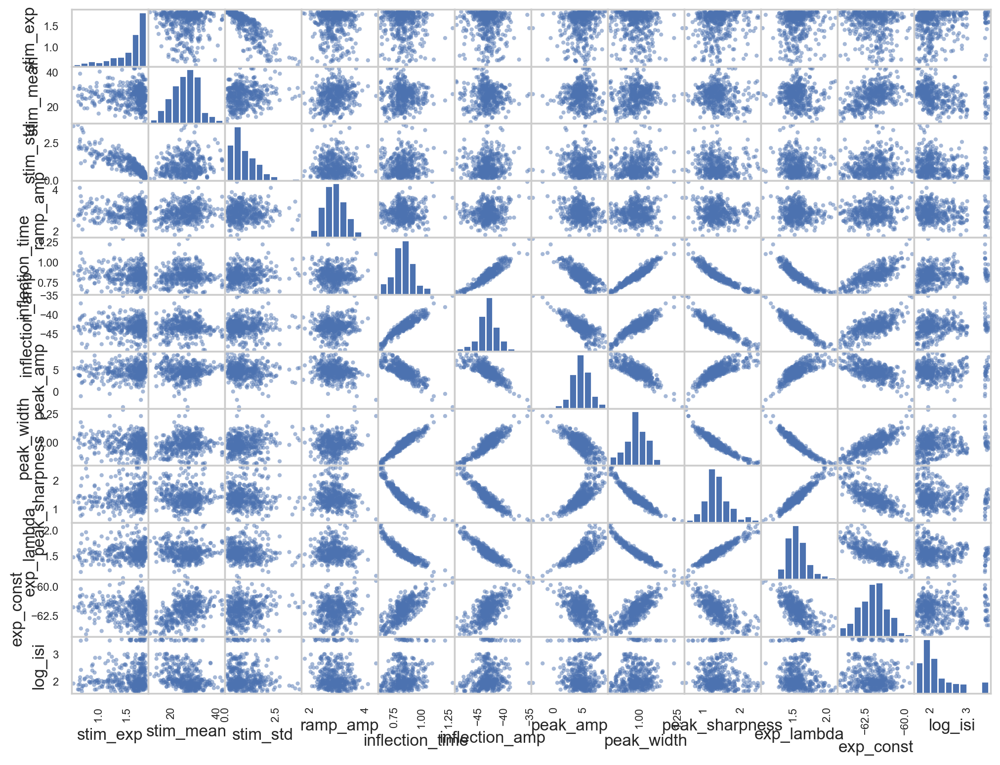

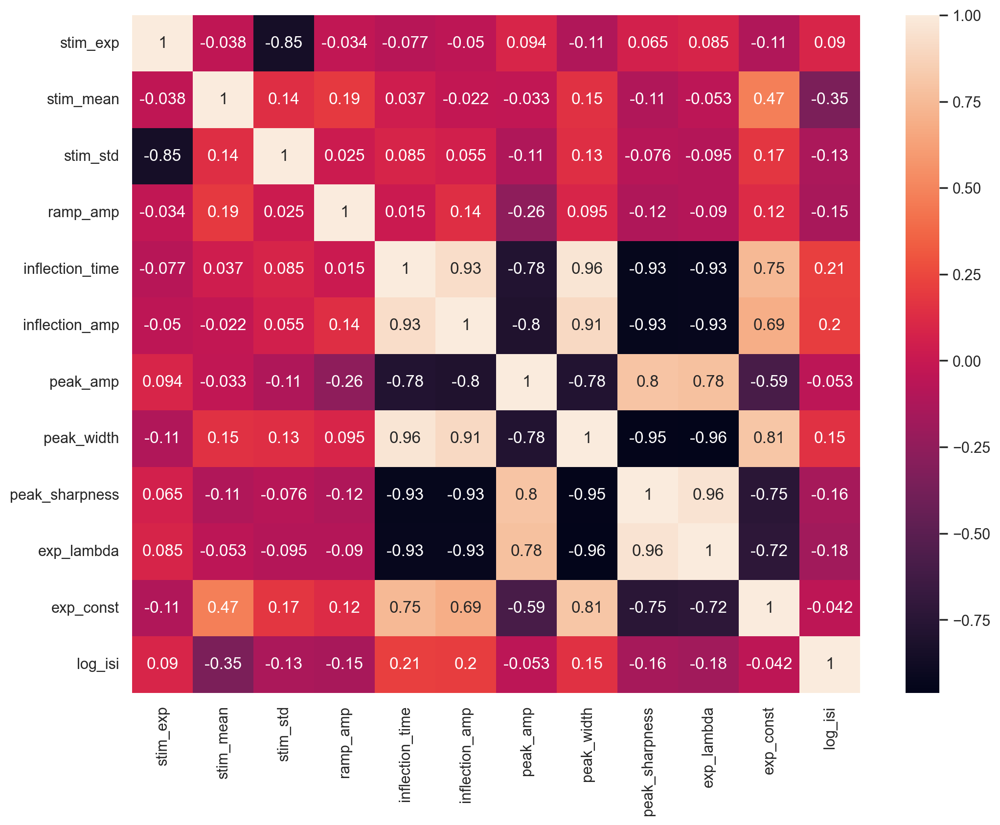

,stim_exp,stim_mean,stim_std,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi
stim_exp,1.0***,-0.04,-0.85***,-0.03,-0.08,-0.05,0.09,-0.11*,0.07,0.09,-0.11*,0.09
stim_mean,-0.04,1.0***,0.14**,0.19***,0.04,-0.02,-0.03,0.15**,-0.11*,-0.05,0.47***,-0.35***
stim_std,-0.85***,0.14**,1.0***,0.02,0.09,0.06,-0.11*,0.13**,-0.08,-0.1,0.17***,-0.13**
ramp_amp,-0.03,0.19***,0.02,1.0***,0.01,0.14**,-0.26***,0.09,-0.12*,-0.09,0.12*,-0.15**
inflection_time,-0.08,0.04,0.09,0.01,1.0***,0.93***,-0.78***,0.96***,-0.93***,-0.93***,0.75***,0.21***
inflection_amp,-0.05,-0.02,0.06,0.14**,0.93***,1.0***,-0.8***,0.91***,-0.93***,-0.93***,0.69***,0.2***
peak_amp,0.09,-0.03,-0.11*,-0.26***,-0.78***,-0.8***,1.0***,-0.78***,0.8***,0.78***,-0.59***,-0.05
peak_width,-0.11*,0.15**,0.13**,0.09,0.96***,0.91***,-0.78***,1.0***,-0.95***,-0.96***,0.81***,0.15**
peak_sharpness,0.07,-0.11*,-0.08,-0.12*,-0.93***,-0.93***,0.8***,-0.95***,1.0***,0.96***,-0.75***,-0.16**
exp_lambda,0.09,-0.05,-0.1,-0.09,-0.93***,-0.93***,0.78***,-0.96***,0.96***,1.0***,-0.72***,-0.18***


In [23]:
df_pink = df.loc[df['stim_type'] == 'pink']
df_pink = df_pink.drop(['sweep', 'stim_type', 'pink_type', 'spike_num'], axis=1)
pd.plotting.scatter_matrix(df_pink, alpha=0.5)
plt.show()
spikes_corr = df_pink.corr()
sns.heatmap(spikes_corr, xticklabels=spikes_corr.columns, yticklabels=spikes_corr.columns, annot=True)
plt.show()
rho = df_pink.corr()
pval = df_pink.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

#### FIRST PINK SPIKES 

Only look at first spike to minimize adaptations etc. effects

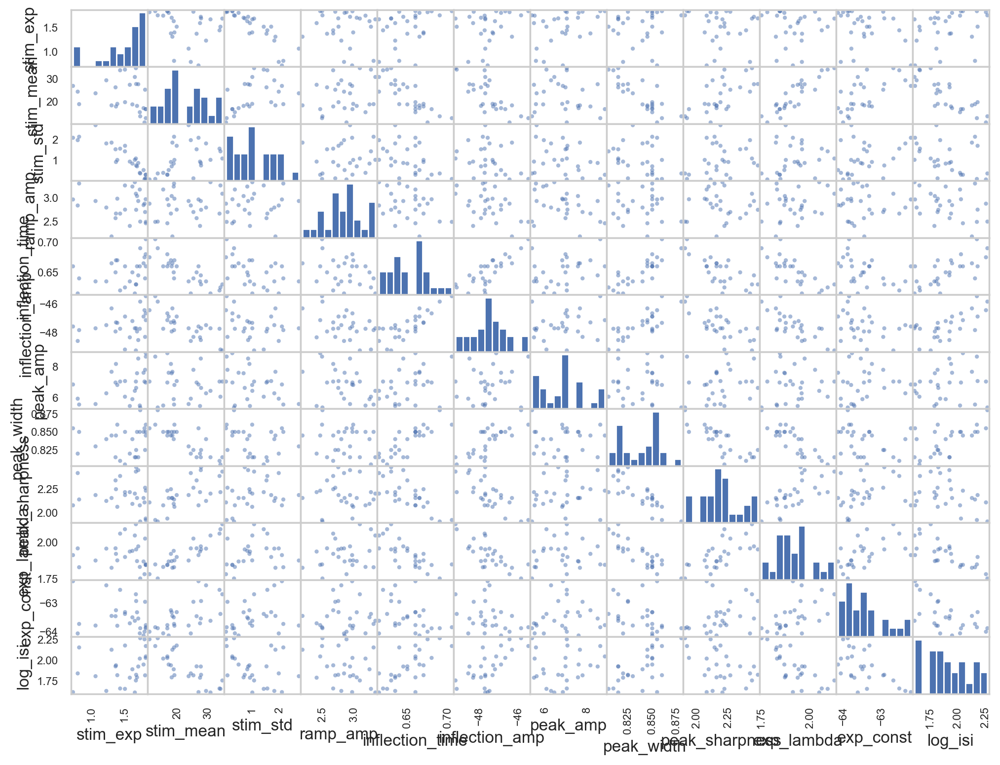

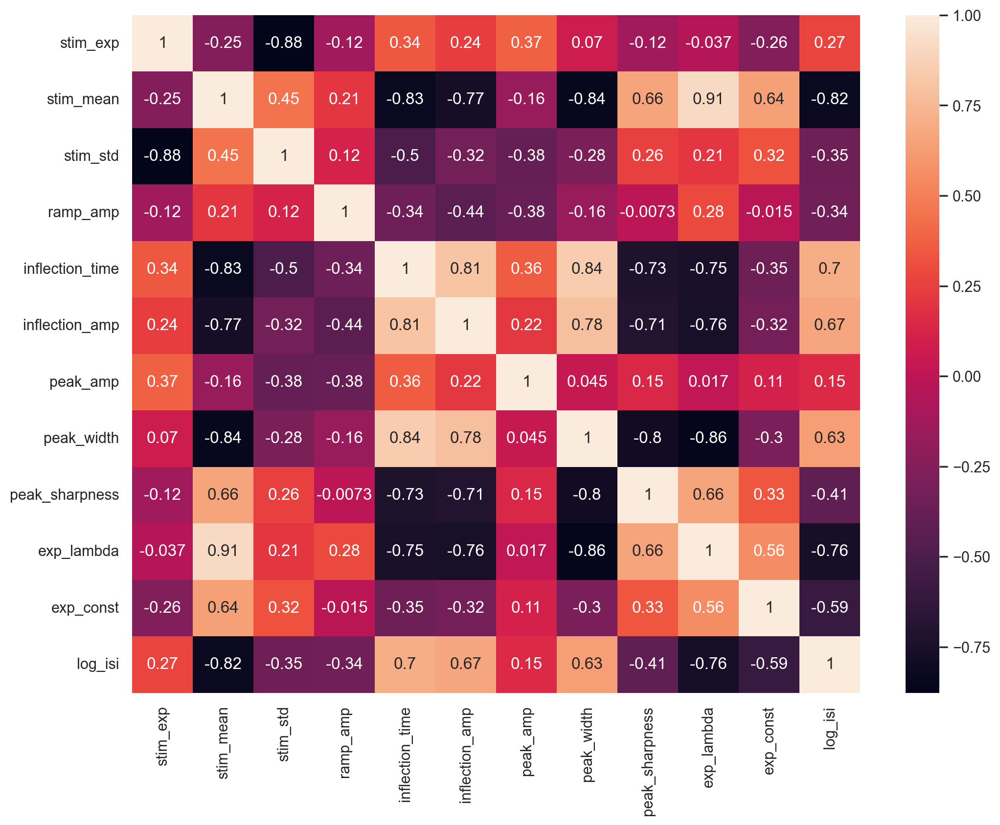

,stim_exp,stim_mean,stim_std,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi
stim_exp,1.0***,-0.25,-0.88***,-0.12,0.34,0.24,0.37,0.07,-0.12,-0.04,-0.26,0.27
stim_mean,-0.25,1.0***,0.45*,0.21,-0.83***,-0.77***,-0.16,-0.84***,0.66***,0.91***,0.64***,-0.82***
stim_std,-0.88***,0.45*,1.0***,0.12,-0.5**,-0.32,-0.38*,-0.28,0.26,0.21,0.32,-0.35
ramp_amp,-0.12,0.21,0.12,1.0***,-0.34,-0.44*,-0.38,-0.16,-0.01,0.28,-0.02,-0.34
inflection_time,0.34,-0.83***,-0.5**,-0.34,1.0***,0.81***,0.36,0.84***,-0.73***,-0.75***,-0.35,0.7***
inflection_amp,0.24,-0.77***,-0.32,-0.44*,0.81***,1.0***,0.22,0.78***,-0.71***,-0.76***,-0.32,0.67***
peak_amp,0.37,-0.16,-0.38*,-0.38,0.36,0.22,1.0***,0.05,0.15,0.02,0.11,0.15
peak_width,0.07,-0.84***,-0.28,-0.16,0.84***,0.78***,0.05,1.0***,-0.8***,-0.86***,-0.3,0.63***
peak_sharpness,-0.12,0.66***,0.26,-0.01,-0.73***,-0.71***,0.15,-0.8***,1.0***,0.66***,0.33,-0.41*
exp_lambda,-0.04,0.91***,0.21,0.28,-0.75***,-0.76***,0.02,-0.86***,0.66***,1.0***,0.56**,-0.76***


In [24]:
df_pink_first = df.loc[df['stim_type'] == 'pink']
df_pink_first = df_pink_first.loc[df['spike_num'] == 0]
df_pink_first = df_pink_first.drop(['sweep', 'stim_type', 'spike_num', 'pink_type',], axis=1)
pd.plotting.scatter_matrix(df_pink_first, alpha=0.5)
plt.show()
spikes_corr = df_pink_first.corr()
sns.heatmap(spikes_corr, xticklabels=spikes_corr.columns, yticklabels=spikes_corr.columns, annot=True)
plt.show()
rho =df_pink_first.corr()
pval = df_pink_first.corr(method=lambda x, y: pearsonr(x, y)[1]) - np.eye(*rho.shape)
p = pval.applymap(lambda x: ''.join(['*' for t in [0.001,0.01,0.05] if x<=t]))
rho.round(2).astype(str) + p

#### CORRELATION SCATTER PLOTS ON PINK SPIKES

In [25]:
# Find which indices are actually present in df_pink, remove last spike of sweeps
valid_indices = [idx for idx in last_spikes_indices if idx in df_pink.index]

# Drop the last spikes
df_pink_filtered = df_pink.drop(valid_indices)

In [26]:
#get dfs for regression models 

df_pink_no_stim_filtered = df_pink_filtered.drop(['stim_exp', 'stim_mean', 'stim_std' ], axis=1)
df_pink_no_stim_first = df_pink_first.drop(['stim_exp', 'stim_mean', 'stim_std' ], axis=1)
df_pink_onlystim_filtered = df_pink_filtered.drop(['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp', 'peak_width','peak_sharpness', 'exp_lambda', 'exp_const' ], axis=1)
df_pink_onlystim_first = df_pink_first.drop(['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp', 'peak_width','peak_sharpness', 'exp_lambda', 'exp_const' ], axis=1)


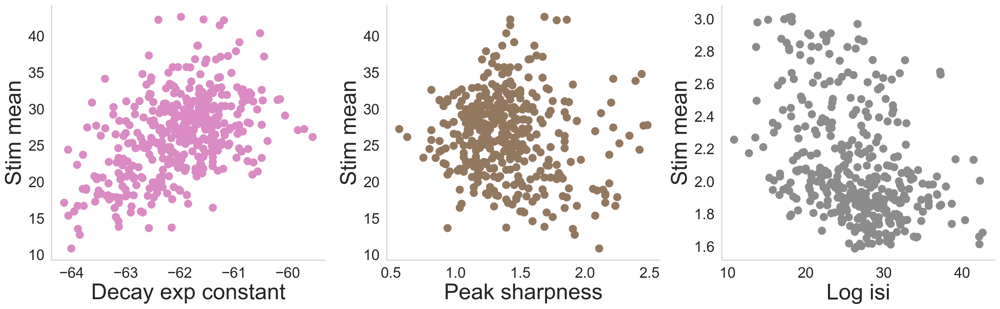

In [27]:
plot_correlation_scatter(df_pink_filtered)

### Step 6: Stimulation type categorical prediction - Logistic Regressions (A) vs SVM (B) vs Random Forest (C) (best)

##### Sanity check of firing rate and sweep length

In [28]:
# Calculate the number of spikes in each sweep
spike_counts = df.groupby('sweep')['spike_num'].count()

# Calculate the duration of each sweep in seconds using the indices from spike_counts
sweep_durations = {sweep: len(all_data[sweep]) / fs for sweep in spike_counts.index}

# Calculate the firing rate for each sweep
firing_rates = {sweep: spike_counts[sweep] / sweep_durations[sweep] for sweep in spike_counts.index}

# Convert the dictionary to a DataFrame for easier handling and visualization
firing_rate_df = pd.DataFrame(list(firing_rates.items()), columns=['Sweep', 'Firing Rate'])

# Extract 'stim_type' values for each unique 'sweep'
stim_type_series = df.groupby('sweep')['stim_type'].first()
# Add the 'stim_type' to the firing_rate_df
firing_rate_df['Stim Type'] = firing_rate_df['Sweep'].map(stim_type_series)

# Display the updated DataFrame
print(firing_rate_df)

    Sweep  Firing Rate Stim Type
0       0     0.569800      ramp
1       1     0.854700      ramp
2       3     0.330797  constant
3       4     0.330797  constant
4       6     0.330797  constant
5       7     0.330797  constant
6      11     7.213921  constant
7      12     0.746268  constant
8      13     0.664451      pink
9      14     1.162790      pink
10     15     1.162790      pink
11     16     0.166113  constant
12     17     1.661128      pink
13     18     2.159467      pink
14     19     1.827241      pink
15     20     0.996677  constant
16     21     4.651159      pink
17     22     4.318933      pink
18     23     4.485046      pink
19     24     1.328903  constant
20     27     0.330797  constant
21     28     0.664451      pink
22     29     0.996677      pink
23     30     1.162790      pink
24     31     0.166113  constant
25     32     1.495015      pink
26     33     2.491692      pink
27     34     2.159467      pink
28     35     0.996677  constant
29     36 

In [29]:
# Define features (X) and target variable (y)
X = df.drop(columns=['stim_type', 'spike_num', 'sweep', 'stim_exp','stim_mean','stim_std', 'pink_type', 'log_isi'], inplace=False)
y = df['stim_type']

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [30]:
df

,sweep,stim_type,spike_num,stim_exp,stim_mean,stim_std,pink_type,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,log_isi
0,0,ramp,0,NaN,NaN,NaN,ramp,2.102273,0.785,-43.468751,9.03125,0.945,1.765625,1.593883,-61.770969,2.952177
1,0,ramp,1,NaN,NaN,NaN,ramp,2.277978,0.880,-41.250001,8.40625,0.985,1.437500,1.520357,-61.217593,2.325238
2,0,ramp,2,NaN,NaN,NaN,ramp,2.188794,0.935,-40.968751,7.71875,1.005,1.234375,1.501276,-60.882459,2.166401
3,0,ramp,3,NaN,NaN,NaN,ramp,2.565857,0.930,-41.250001,8.06250,1.010,1.296875,1.536490,-60.380460,3.779297
4,1,ramp,0,NaN,NaN,NaN,ramp,2.319044,0.835,-42.437501,9.15625,0.950,1.578125,1.630889,-63.035684,2.315949
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
815,65,constant,45,NaN,NaN,NaN,constant,3.534053,0.980,-40.843751,1.00000,1.165,0.843750,1.297449,-58.401222,1.320250
816,65,constant,46,NaN,NaN,NaN,constant,3.775465,0.970,-40.906251,1.93750,1.120,0.890625,1.421559,-57.824847,1.324488
817,65,constant,47,NaN,NaN,NaN,constant,3.736724,0.980,-40.531251,1.28125,1.140,0.843750,1.405411,-57.515739,1.351989
818,65,constant,48,NaN,NaN,NaN,constant,4.195282,0.980,-39.718751,0.62500,1.140,0.843750,1.325566,-58.077151,1.343113


#### (A) Logistic Regression

In [31]:
#logr_model, logr_accs = logistic_regression_stim(X, y, X_train, X_test, y_train, y_test)

In [32]:
"""
with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/logr_model.pkl', 'wb') as file:
    pickle.dump(logr_model, file)

with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/logr_accs.pkl', 'wb') as file:
    pickle.dump(logr_accs, file)

"""

"\nwith open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/logr_model.pkl', 'wb') as file:\n    pickle.dump(logr_model, file)\n\nwith open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/logr_accs.pkl', 'wb') as file:\n    pickle.dump(logr_accs, file)\n\n"

In [33]:
# Load saved pickles 
with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/logr_model.pkl', 'rb') as file:
    logr_model = pickle.load(file)

with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/logr_accs.pkl', 'rb') as file:
    logr_accs = pickle.load(file)

In [34]:
logr_acc = logr_model.score(X_test, y_test)


#### (B) SVM

In [35]:
#svm_model, svm_accs = svm_stim(X, y, X_train, X_test, y_train, y_test)

In [36]:
"""
with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/svm_model.pkl', 'wb') as file:
    pickle.dump(svm_model, file)

with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/svm_accs.pkl', 'wb') as file:
    pickle.dump(svm_accs, file)

"""

"\nwith open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/svm_model.pkl', 'wb') as file:\n    pickle.dump(svm_model, file)\n\nwith open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/svm_accs.pkl', 'wb') as file:\n    pickle.dump(svm_accs, file)\n\n"

In [37]:
# Load saved pickles 
with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/svm_model.pkl', 'rb') as file:
    svm_model = pickle.load(file)

with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/svm_accs.pkl', 'rb') as file:
    svm_accs = pickle.load(file)

In [38]:
svm_acc = logr_model.score(X_test, y_test)

#### (C) Random Forest

In [39]:
#rf_model, rf_accs = random_forest_stim(X, y, X_train, X_test, y_train, y_test)

In [40]:
"""
with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/rf_model.pkl', 'wb') as file:
    pickle.dump(rf_model, file)


with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/rf_accs.pkl', 'wb') as file:
    pickle.dump(rf_accs, file)

"""

"\nwith open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/rf_model.pkl', 'wb') as file:\n    pickle.dump(rf_model, file)\n\n\nwith open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/rf_accs.pkl', 'wb') as file:\n    pickle.dump(rf_accs, file)\n\n"

In [41]:
# Load saved pickles 
with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/rf_model.pkl', 'rb') as file:
    rf_model = pickle.load(file)

with open('/Users/blancamartin/Desktop/Voytek_Lab/spike_waveform/pvc6_pickles/rf_accs.pkl', 'rb') as file:
    rf_accs = pickle.load(file)

In [42]:
rf_model

RandomForestClassifier(max_depth=10, n_estimators=50, random_state=42)

In [43]:
# Calculate average accuracy
rf_avg_accs = np.mean(rf_accs)

rf_stdev_accs = np.std(rf_accs)

#### Compare 3 categorical models and plot results for the model with best accuracy (Random Forest) 

In [44]:
print(f"Accuracy Logistic Regression: {logr_acc: .3f}")
print(f"Accuracy SVM: {svm_acc: .3f}")
print(f"Mean Accuracy Random Forest: {rf_avg_accs: .3f}")
print(f"Stdev Accuracy Random Forest: {rf_stdev_accs: .3f}")

Accuracy Logistic Regression:  0.622
Accuracy SVM:  0.622
Mean Accuracy Random Forest:  0.733
Stdev Accuracy Random Forest:  0.017


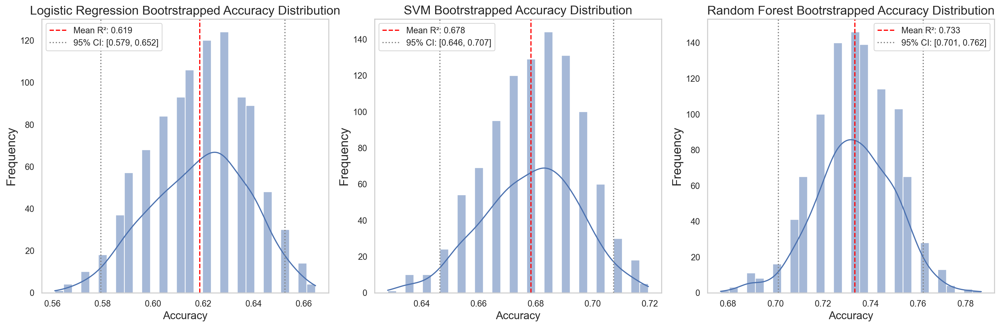

In [45]:
plot_bootstrap_histograms([logr_accs, svm_accs, rf_accs], ["Logistic Regression", "SVM", "Random Forest"])

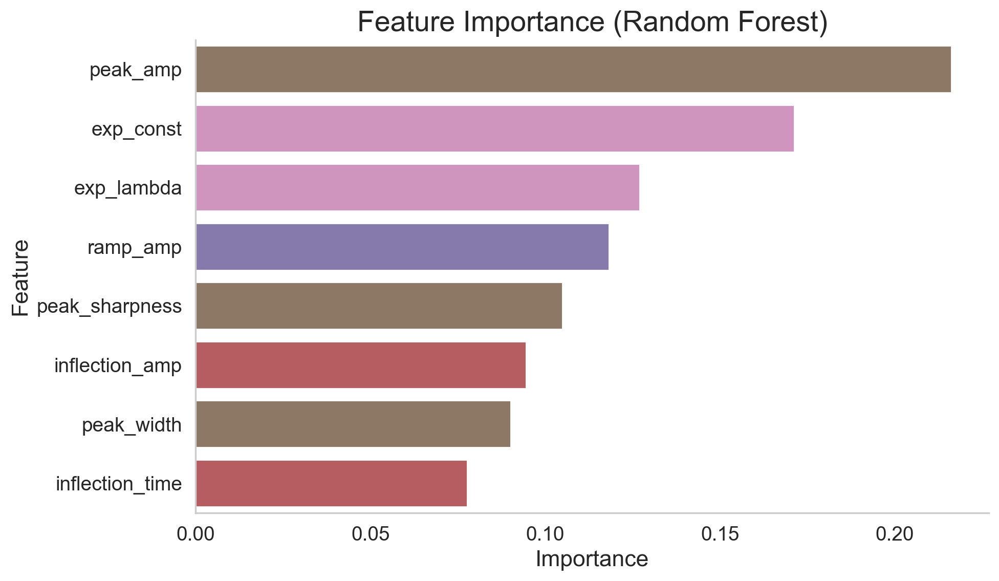

In [46]:
plot_feature_importance_categorical(rf_model,X)

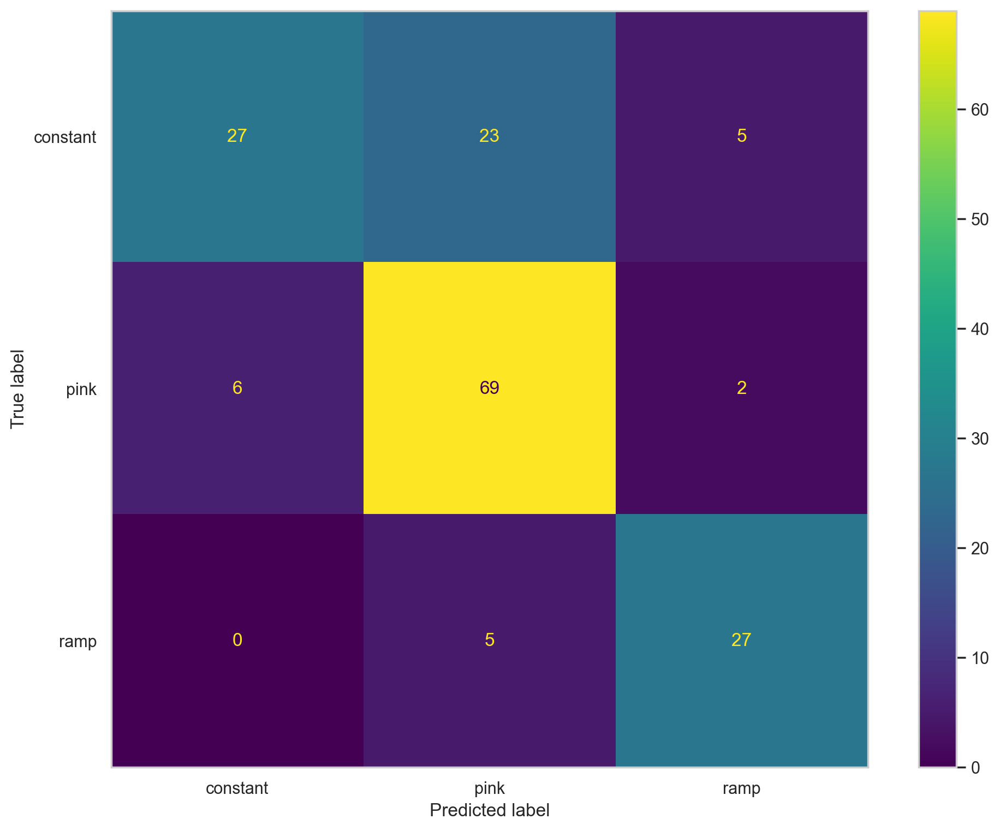

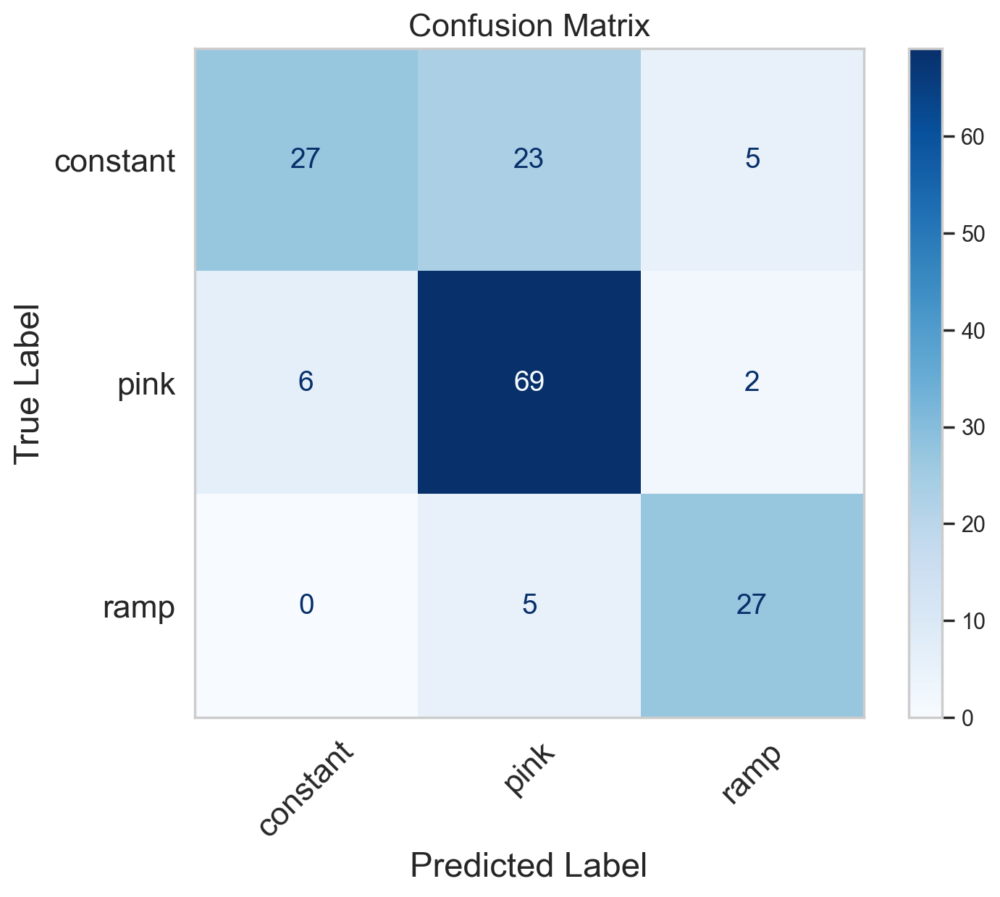

In [47]:
plot_confusion_matrix(rf_model, X_test, y_test)

### Step 7: Pink noise predictions - Ridge regression with kfold and bootstrapping 

In [48]:
# Store results for each stimulus feature
ridge_results_dict = {}

for stim_feature in ['stim_exp', 'stim_mean', 'stim_std']:
    print(f"\n--- Processing {stim_feature} ---\n")

    # Filter data for the current stimulus feature
    data = df_pink_filtered.dropna(subset=[stim_feature])
    
    # Define features (X) and target variable (y)
    X = data.drop(columns=['stim_exp', 'stim_mean', 'stim_std'])
    y = data[stim_feature]

    # Run Ridge Regression with K-Fold and Bootstrapping
    ridge_results = run_ridge_regression_kfold(X, y)
    ridge_results_dict[stim_feature] = ridge_results
    
    # Print R² statistics
    print(f"Mean R² for {stim_feature}: {ridge_results['r2_mean']:.3f}")
    print(f"95% CI for R²: {ridge_results['r2_ci']}")



--- Processing stim_exp ---

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions

#### Plot results


--- Plotting stim_exp ---



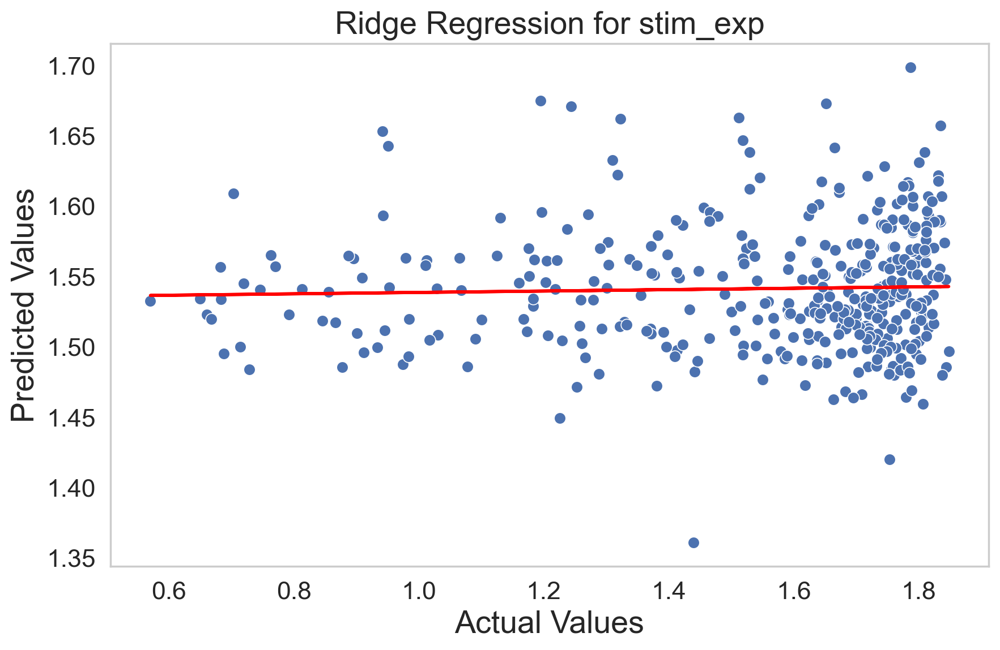

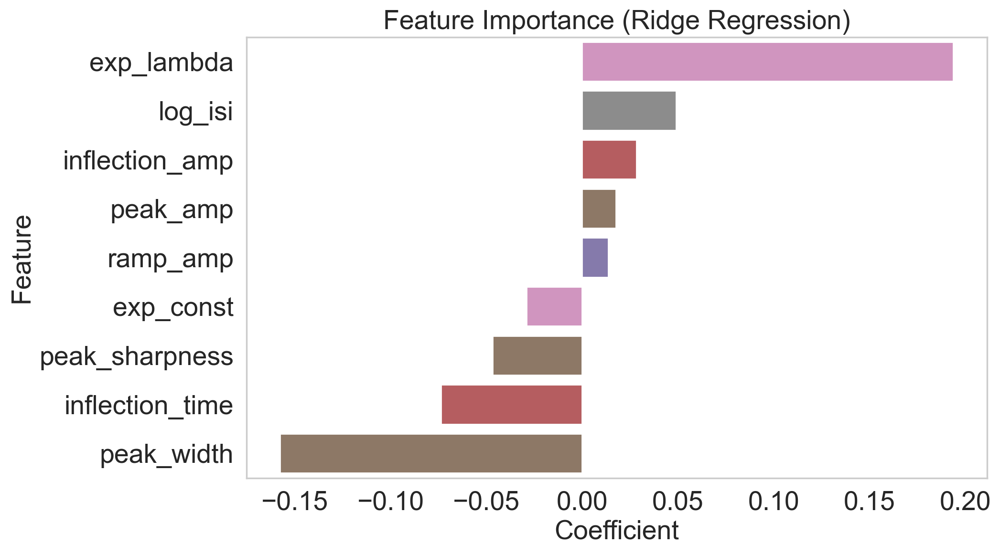


Significant Features (p < 0.05):
           Feature  Coefficient  CI Lower  CI Upper        p-value
6       exp_lambda     0.193756 -0.057562  0.437535  1.999087e-256
8          log_isi     0.048967 -0.038033  0.132779  1.047718e-173
2   inflection_amp     0.028426 -0.011361  0.069219  4.190657e-223
3         peak_amp     0.017538 -0.015304  0.051894  1.368619e-169
0         ramp_amp     0.013665 -0.071436  0.104085   2.431727e-21
7        exp_const    -0.029103 -0.080478  0.016790  1.225167e-187
5   peak_sharpness    -0.046808 -0.288470  0.161482   3.993664e-38
1  inflection_time    -0.073762 -0.307210  0.161602   3.470827e-65
4       peak_width    -0.157810 -0.305791  0.002270   0.000000e+00


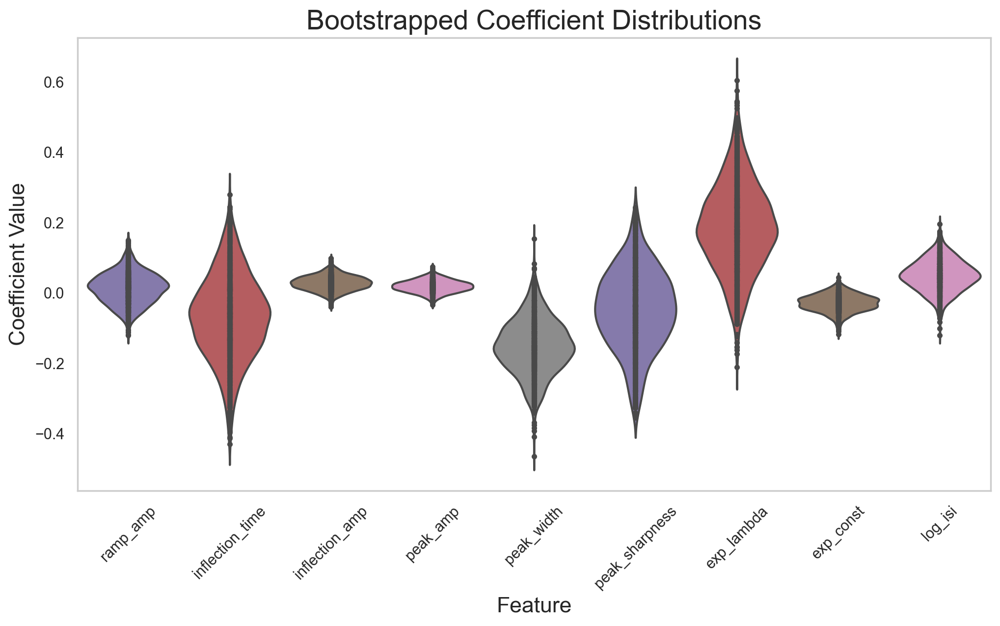

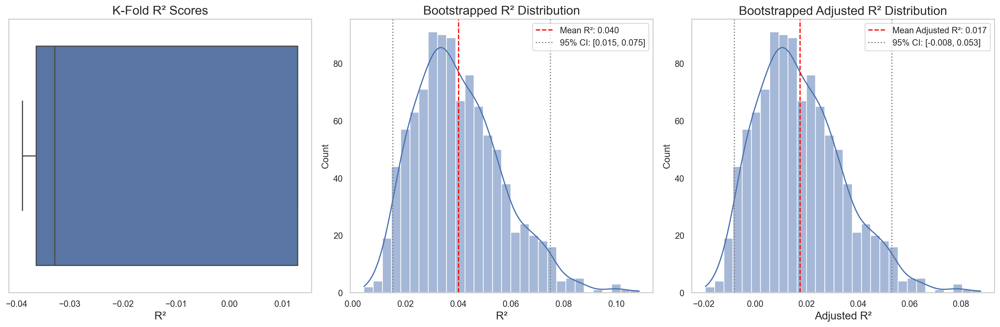


Mean Adjusted R-squared (Bootstrapped): 0.017
95% CI for Adjusted R-squared: [-0.00813823  0.05310095]

--- Plotting stim_mean ---



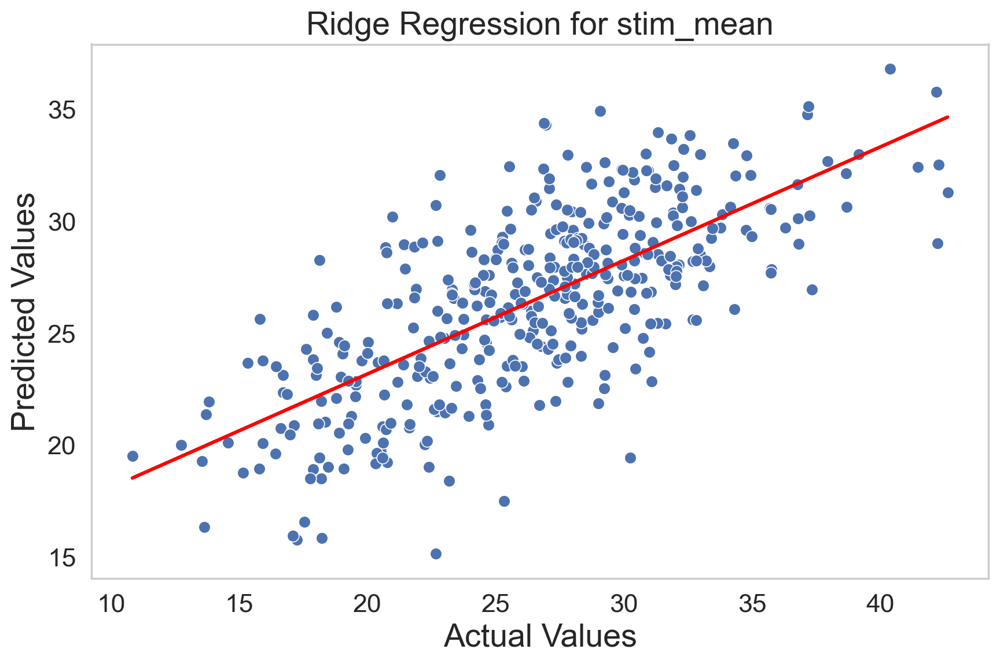

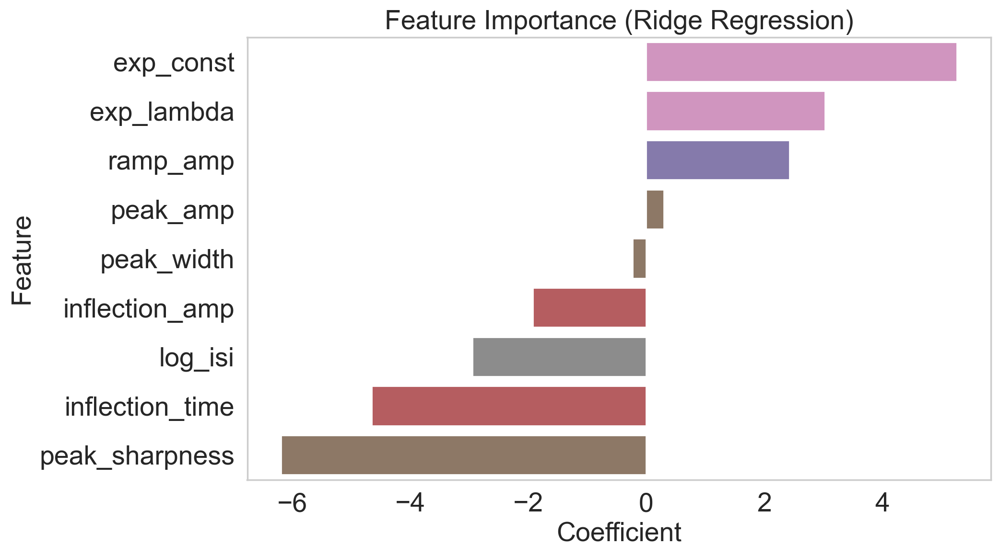


Significant Features (p < 0.05):
           Feature  Coefficient  CI Lower  CI Upper        p-value
7        exp_const     5.261520  4.539198  5.998689   0.000000e+00
6       exp_lambda     3.024538 -0.587866  6.512994  2.435739e-288
0         ramp_amp     2.424795  1.344694  3.490653   0.000000e+00
3         peak_amp     0.298933 -0.109540  0.725388  1.171946e-249
4       peak_width    -0.235250 -2.200315  1.989537   9.957592e-13
2   inflection_amp    -1.923288 -2.449393 -1.417249   0.000000e+00
8          log_isi    -2.947435 -4.070097 -1.820304   0.000000e+00
1  inflection_time    -4.653701 -7.525607 -1.687636   0.000000e+00
5   peak_sharpness    -6.187712 -9.118695 -3.422900   0.000000e+00


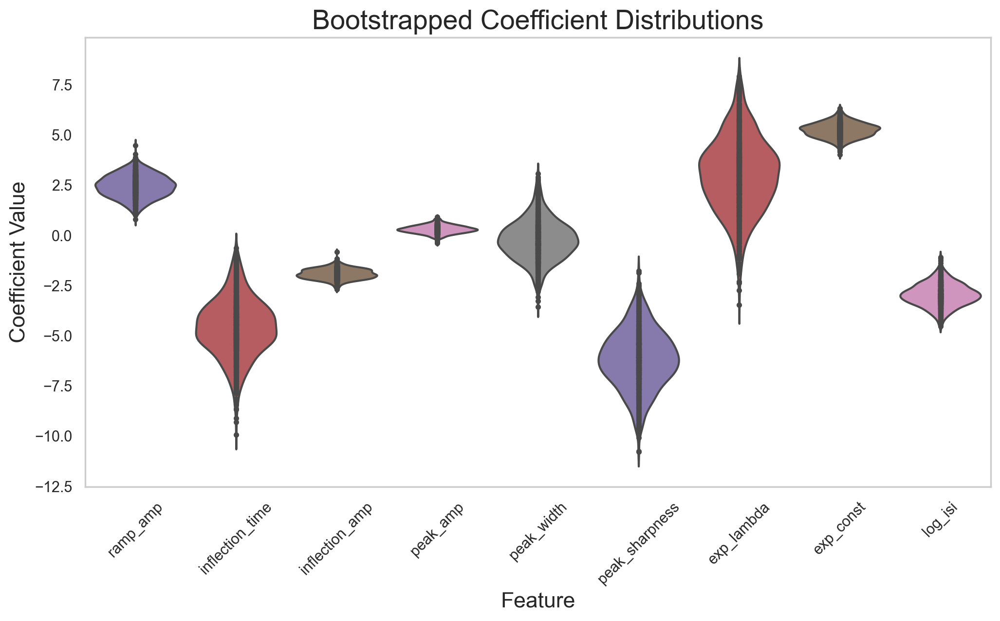

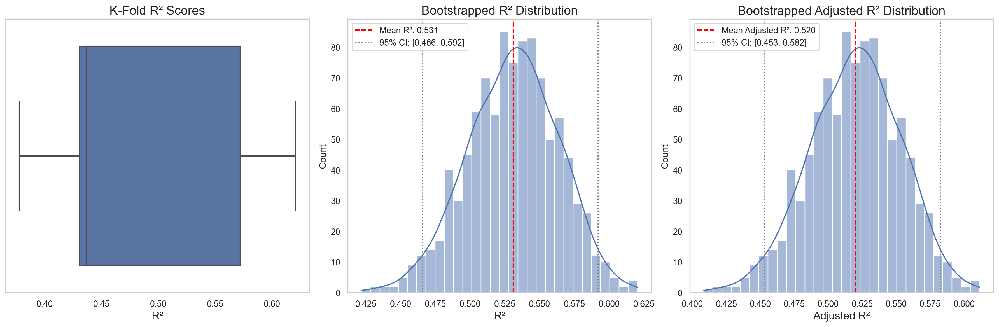


Mean Adjusted R-squared (Bootstrapped): 0.520
95% CI for Adjusted R-squared: [0.45310495 0.58230782]

--- Plotting stim_std ---



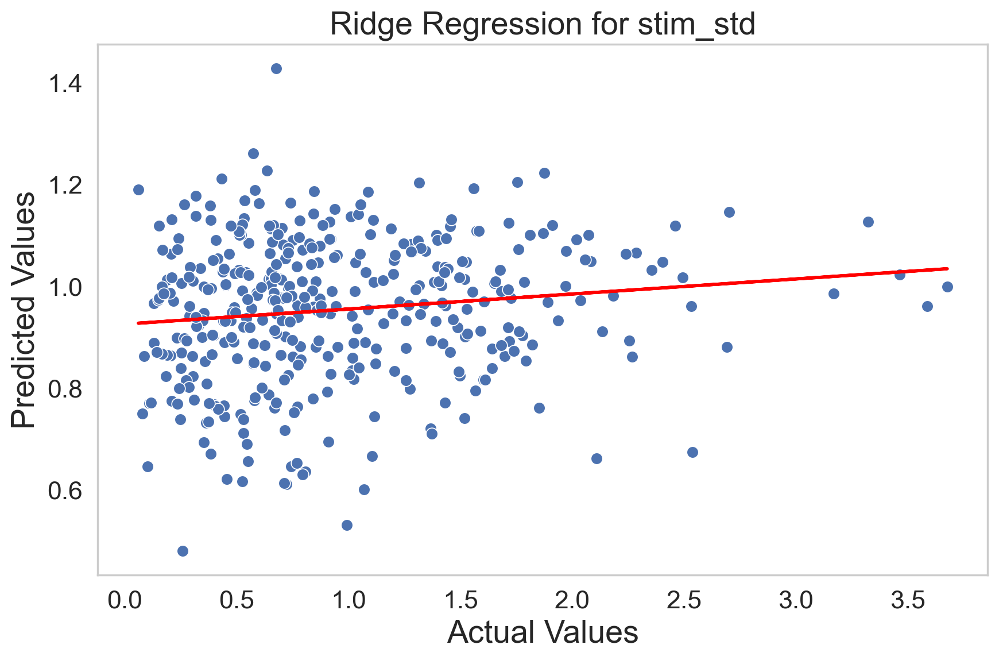

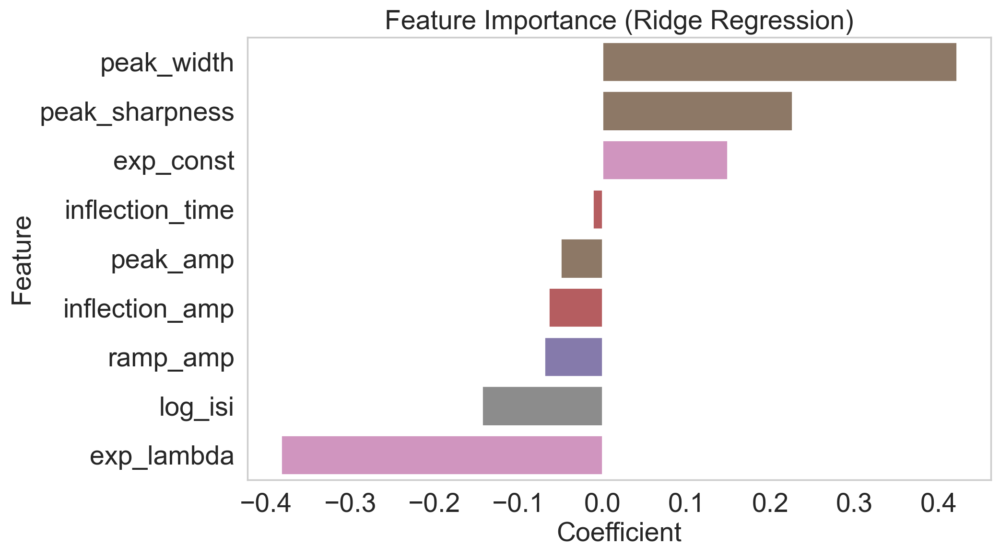


Significant Features (p < 0.05):
          Feature  Coefficient  CI Lower  CI Upper        p-value
4      peak_width     0.421711  0.105303  0.749061   0.000000e+00
5  peak_sharpness     0.225728 -0.231125  0.746273  9.685853e-149
7       exp_const     0.148726  0.049329  0.252063   0.000000e+00
3        peak_amp    -0.049854 -0.116908  0.012092  2.944049e-256
2  inflection_amp    -0.063871 -0.138475  0.015074  3.566262e-258
0        ramp_amp    -0.068840 -0.243538  0.103963  1.595536e-108
8         log_isi    -0.143175 -0.344231  0.051898  2.796121e-253
6      exp_lambda    -0.382285 -0.904455  0.118987  5.370154e-243


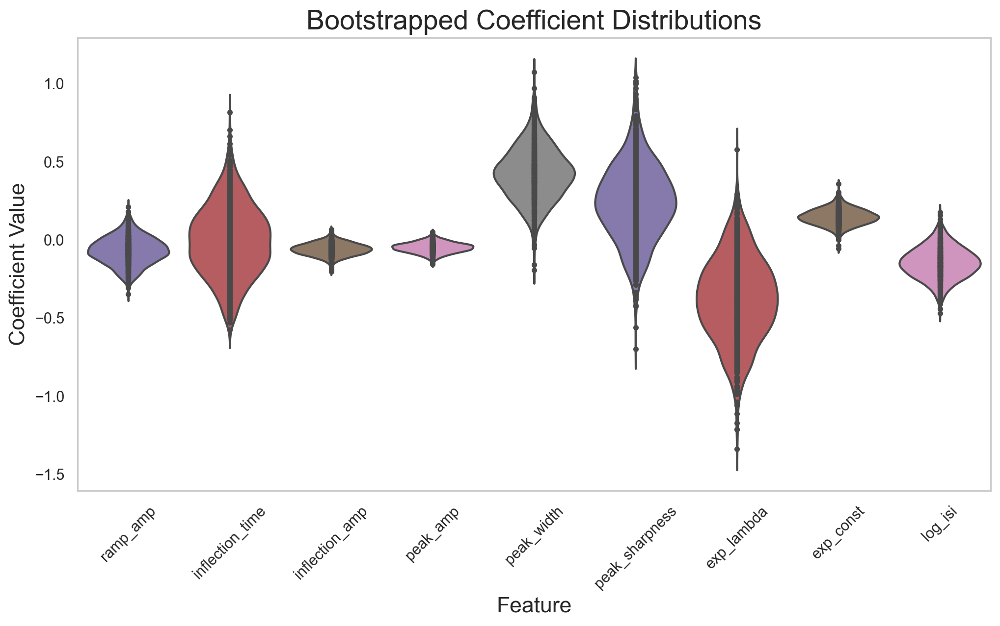

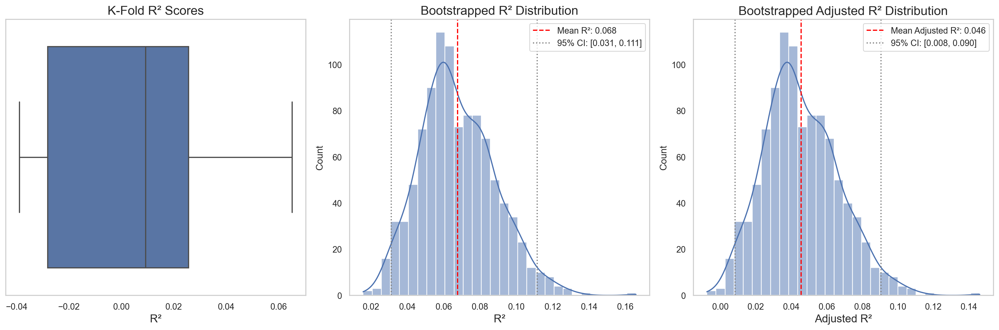


Mean Adjusted R-squared (Bootstrapped): 0.046
95% CI for Adjusted R-squared: [0.00824128 0.09047851]


In [49]:

for stim_feature in ['stim_exp', 'stim_mean', 'stim_std']:
    print(f"\n--- Plotting {stim_feature} ---\n")

    # Filter data for the current stimulus feature
    data = df_pink_filtered.dropna(subset=[stim_feature])
    
    y = data[stim_feature]
    
    # Plot the Results
    plot_ridge_results(y, ridge_results_dict[stim_feature], title=f"Ridge Regression for {stim_feature}")


### Step 8: Log Isi predictor (using only spk features, only stim feautes, and both) - Ridge regression with kfold and bootstrapping 

#### Only spike features 

In [50]:
# Define features (X) and target variable (y)
X_spike_only = df_pink_filtered.drop(columns=['log_isi', 'stim_exp', 'stim_mean', 'stim_std'])  # Drop log_isi and stimulus features
y_log_isi = df_pink_filtered['log_isi']

# Run Ridge Regression with K-Fold and Bootstrapping
ridge_results_spike_only = run_ridge_regression_kfold(X_spike_only, y_log_isi)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


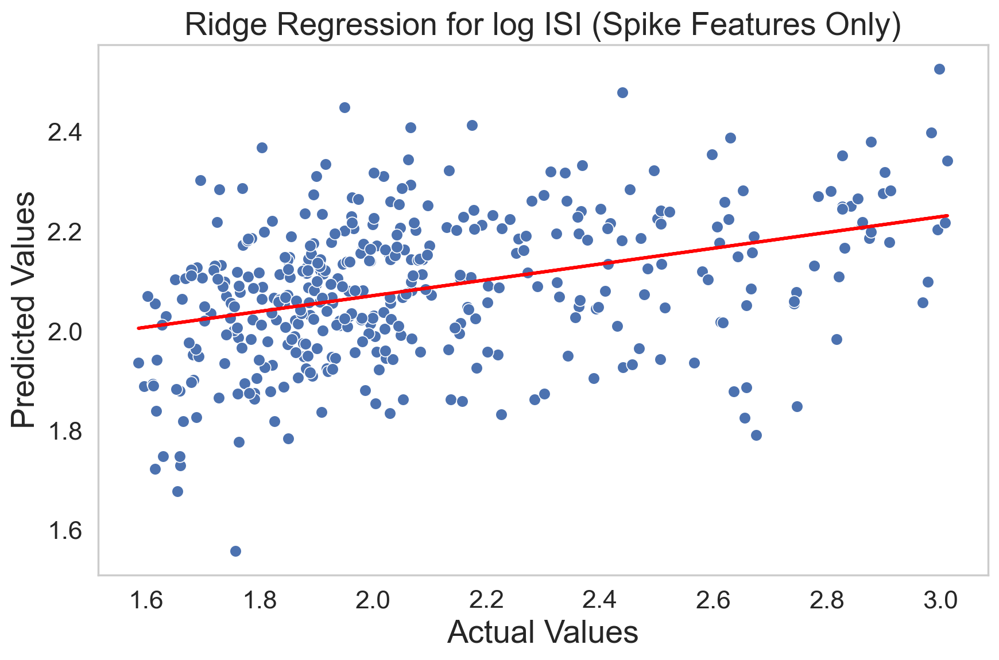

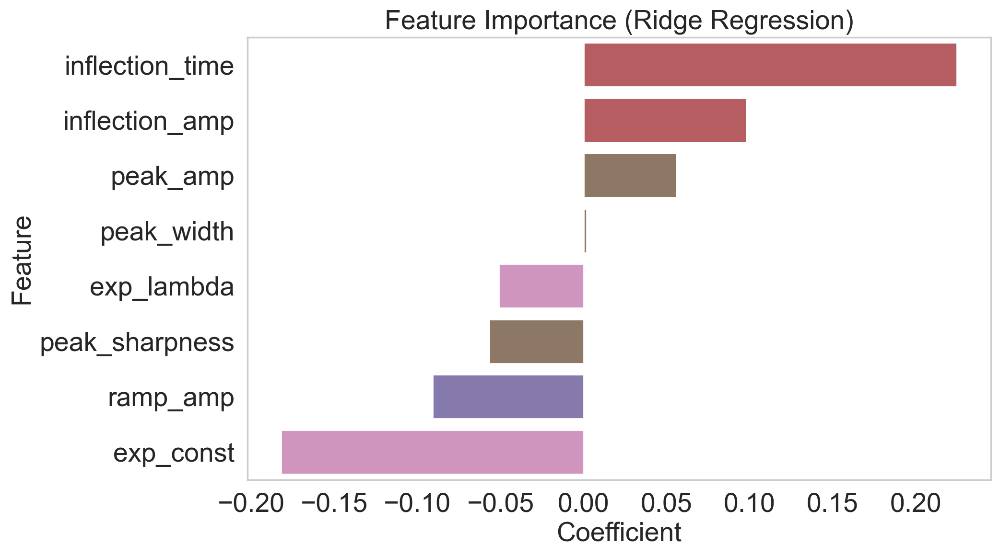


Significant Features (p < 0.05):
           Feature  Coefficient  CI Lower  CI Upper       p-value
1  inflection_time     0.224789  0.015469  0.429418  0.000000e+00
2   inflection_amp     0.097981  0.055943  0.143644  0.000000e+00
3         peak_amp     0.055917  0.021415  0.091352  0.000000e+00
6       exp_lambda    -0.051019 -0.290390  0.201285  1.895781e-31
5   peak_sharpness    -0.056633 -0.285920  0.173377  5.399651e-55
0         ramp_amp    -0.090723 -0.170731 -0.015303  0.000000e+00
7        exp_const    -0.182107 -0.239844 -0.121170  0.000000e+00


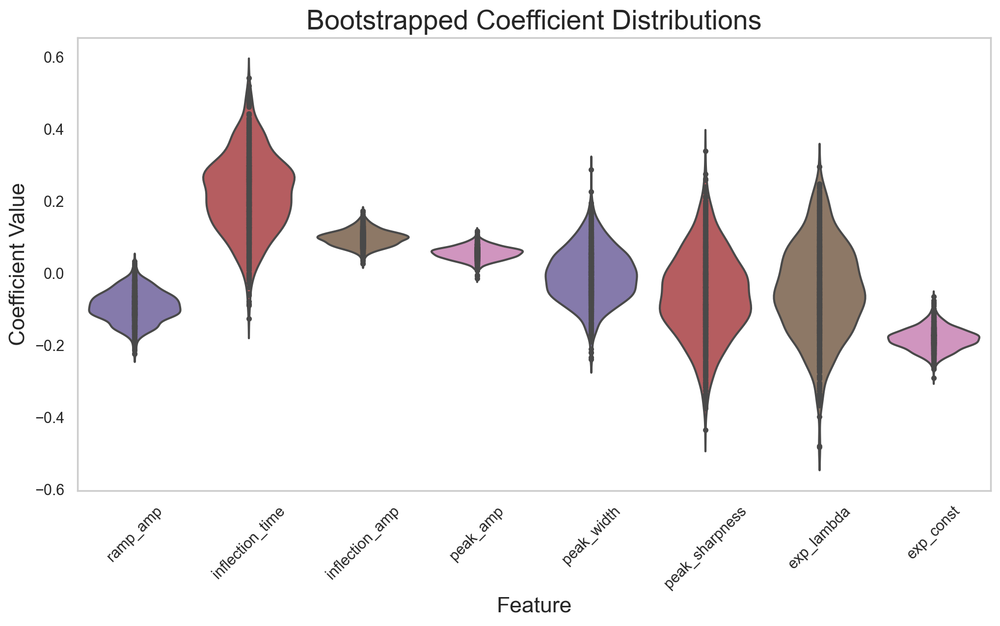

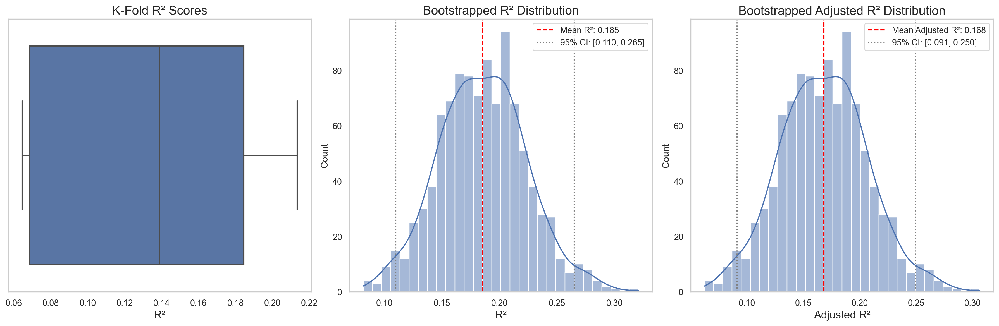


Mean Adjusted R-squared (Bootstrapped): 0.168
95% CI for Adjusted R-squared: [0.09125773 0.24955482]


In [51]:
# Plot the Results
plot_ridge_results(y_log_isi, ridge_results_spike_only, title="Ridge Regression for log ISI (Spike Features Only)")

#### Both spike and stimulus features

In [52]:
# Define features (X) and target variable (y)
X_spike_stim = df_pink_filtered.drop(columns=['log_isi'])  # Drop only the target variable
y_log_isi = df_pink_filtered['log_isi']

# Run Ridge Regression with K-Fold and Bootstrapping
ridge_results_spike_stim = run_ridge_regression_kfold(X_spike_stim, y_log_isi)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


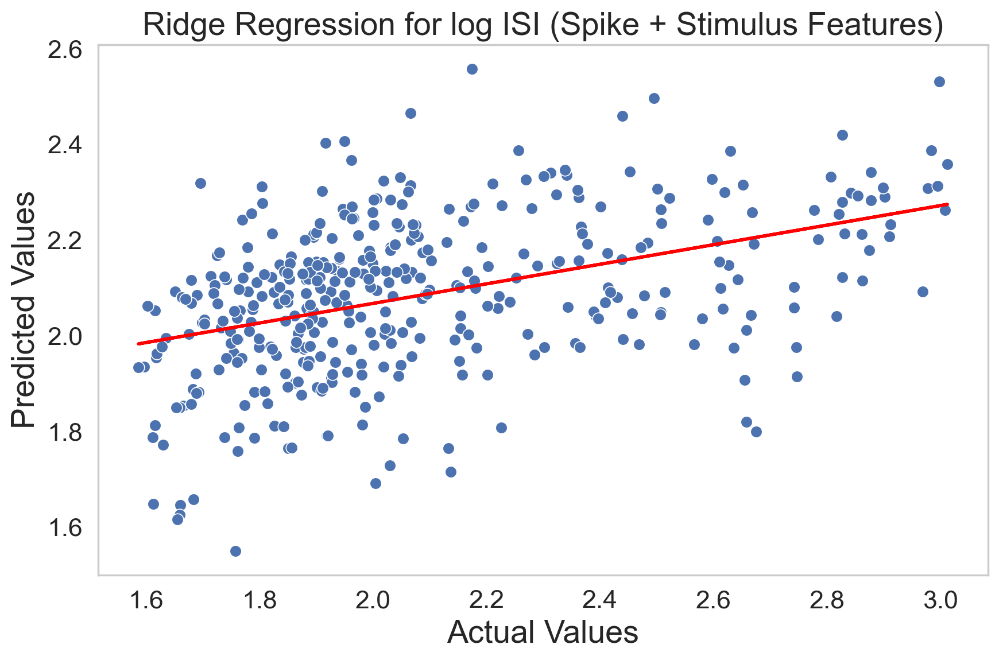

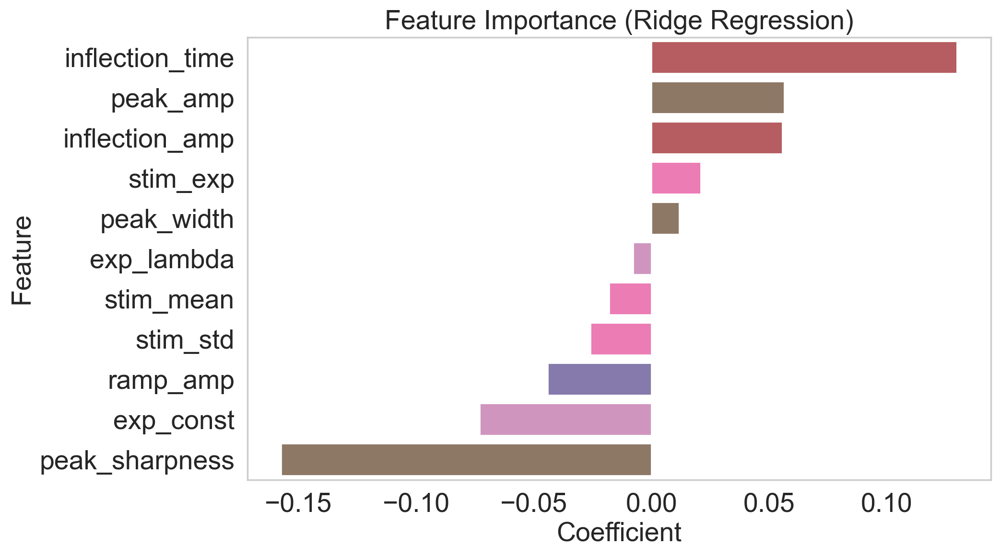


Significant Features (p < 0.05):
            Feature  Coefficient  CI Lower  CI Upper        p-value
4   inflection_time     0.129755 -0.079886  0.342831  4.595256e-193
6          peak_amp     0.056399  0.019536  0.093887   0.000000e+00
5    inflection_amp     0.055652  0.007438  0.105438   0.000000e+00
0          stim_exp     0.020889 -0.145757  0.173962   1.115742e-12
7        peak_width     0.011783 -0.130268  0.157190   2.466393e-06
9        exp_lambda    -0.007850 -0.252981  0.220777   7.326859e-04
1         stim_mean    -0.017911 -0.025067 -0.010248   0.000000e+00
2          stim_std    -0.025872 -0.109200  0.062305   1.174718e-68
3          ramp_amp    -0.044141 -0.136621  0.045811  8.060353e-147
10        exp_const    -0.072938 -0.142122 -0.001055   0.000000e+00
8    peak_sharpness    -0.157385 -0.372856  0.049894  5.353716e-240


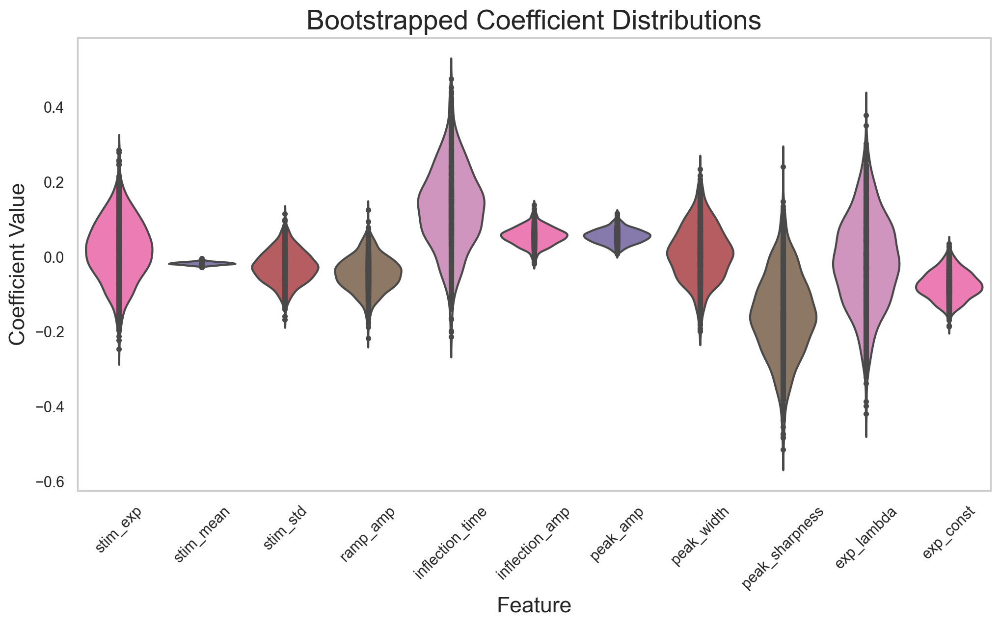

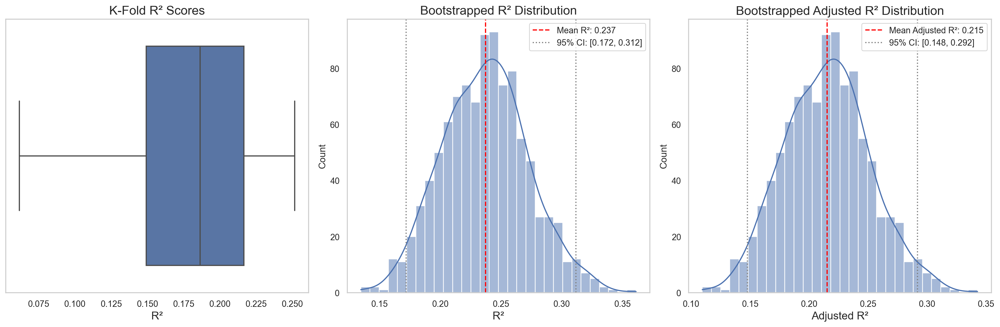


Mean Adjusted R-squared (Bootstrapped): 0.215
95% CI for Adjusted R-squared: [0.147639 0.291707]


In [53]:
# Plot the Results
plot_ridge_results(y_log_isi, ridge_results_spike_stim, title="Ridge Regression for log ISI (Spike + Stimulus Features)")

#### Only stimulus features 

In [54]:
# Define features (X) and target variable (y)
X_stim_only = df_pink_filtered[['stim_exp', 'stim_mean', 'stim_std']]  # Use only stimulus features
y_log_isi = df_pink_filtered['log_isi']

# Run Ridge Regression with K-Fold and Bootstrapping
ridge_results_stim_only = run_ridge_regression_kfold(X_stim_only, y_log_isi)


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


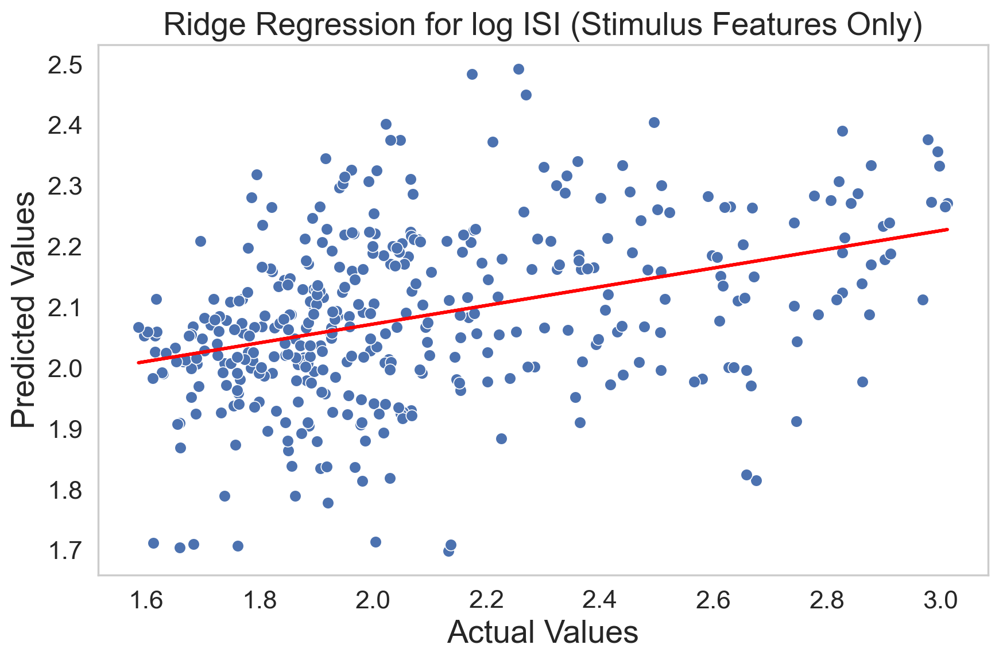

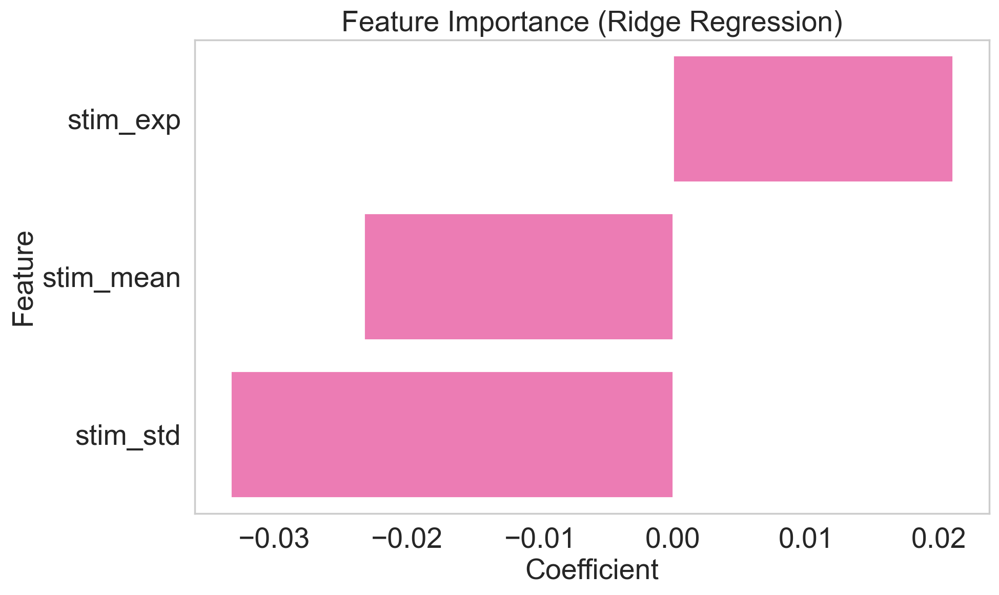


Significant Features (p < 0.05):
     Feature  Coefficient  CI Lower  CI Upper        p-value
0   stim_exp     0.021071 -0.137251  0.197037   3.624665e-14
1  stim_mean    -0.023258 -0.029116 -0.017491   0.000000e+00
2   stim_std    -0.033266 -0.118409  0.051944  2.507069e-107


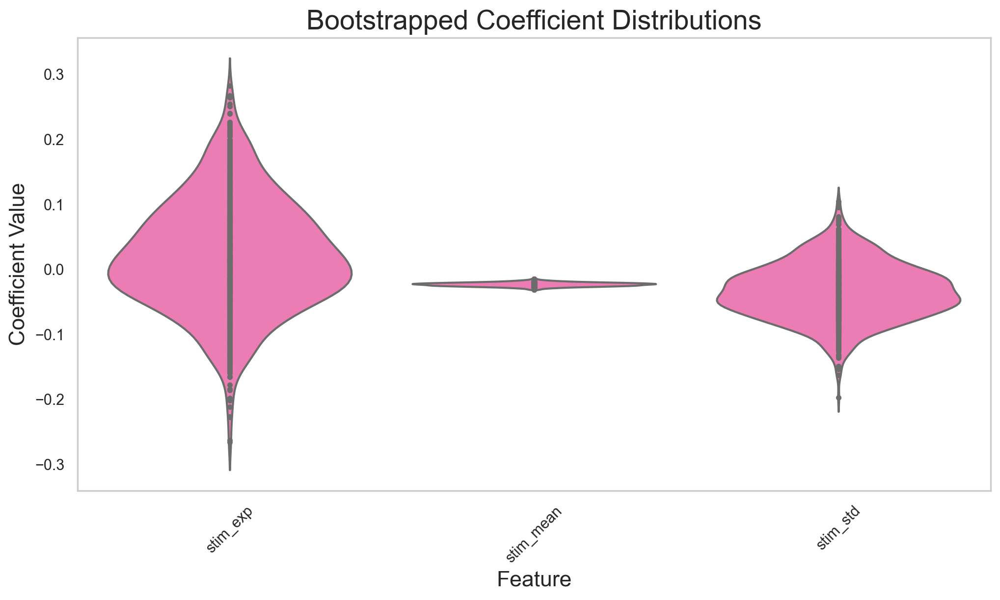

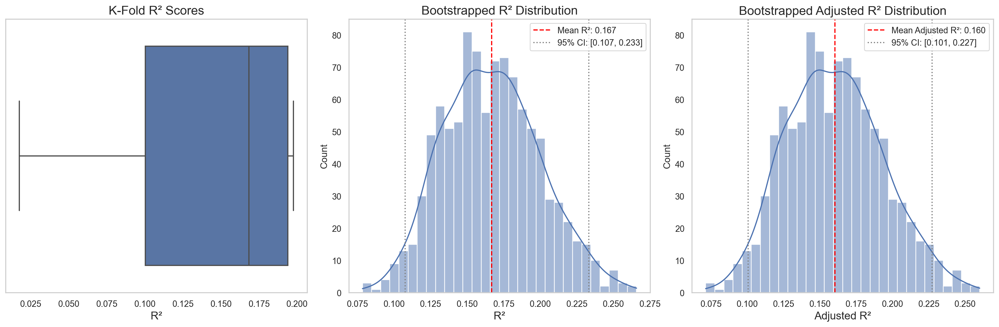


Mean Adjusted R-squared (Bootstrapped): 0.160
95% CI for Adjusted R-squared: [0.10057178 0.22715463]


In [55]:
# Plot the Results
plot_ridge_results(y_log_isi, ridge_results_stim_only, title="Ridge Regression for log ISI (Stimulus Features Only)")

### Compare 3 models for log ISI prediction

In [56]:
#Set up dataframes for plotting 

feature_importance_spike_only_df = pd.DataFrame({'Feature': ridge_results_spike_only['feature_names'], 'Coefficient': ridge_results_spike_only['coefficients']})
feature_importance_spike_stim_df = pd.DataFrame({'Feature': ridge_results_spike_stim['feature_names'], 'Coefficient': ridge_results_spike_stim['coefficients']})
feature_importance_stim_only_df = pd.DataFrame({'Feature': ridge_results_stim_only['feature_names'], 'Coefficient': ridge_results_stim_only['coefficients']})

feature_importance_spike_only_df['Model'] = 'No stim features'
feature_importance_spike_stim_df['Model'] = 'With stim features (Combined)'
feature_importance_stim_only_df['Model'] = 'Only stim features'

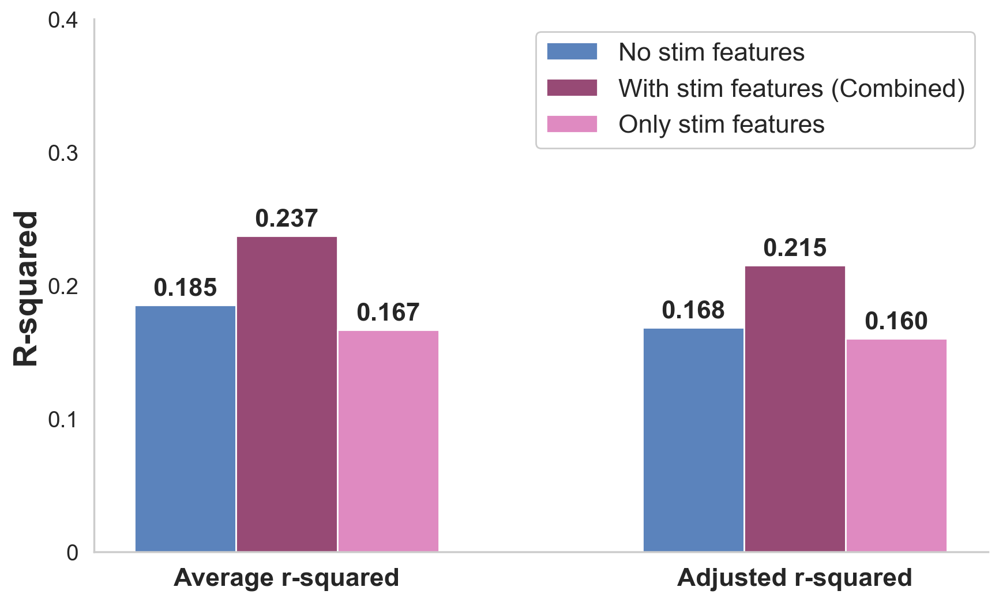

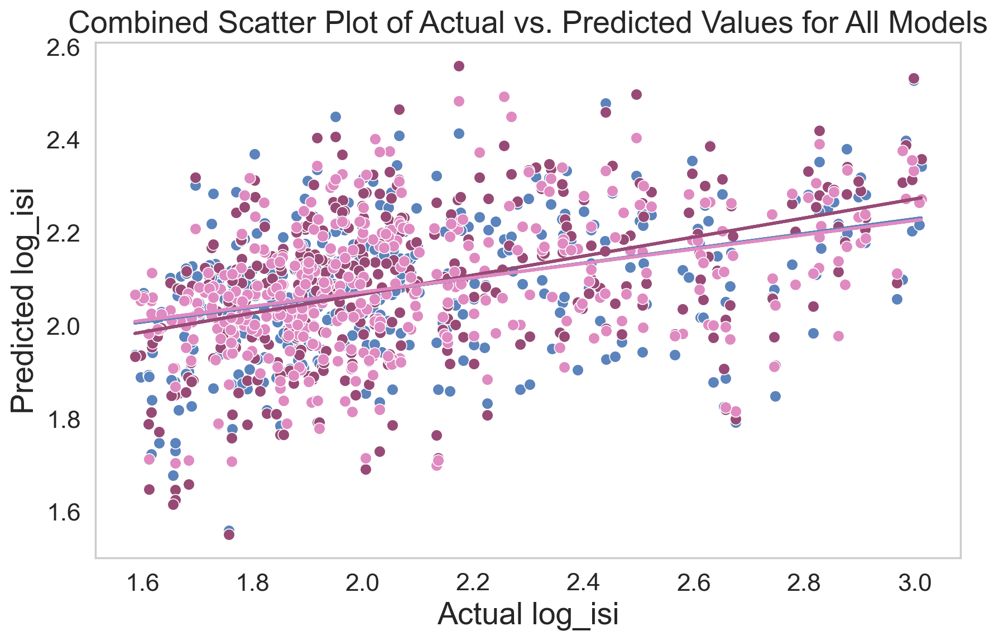

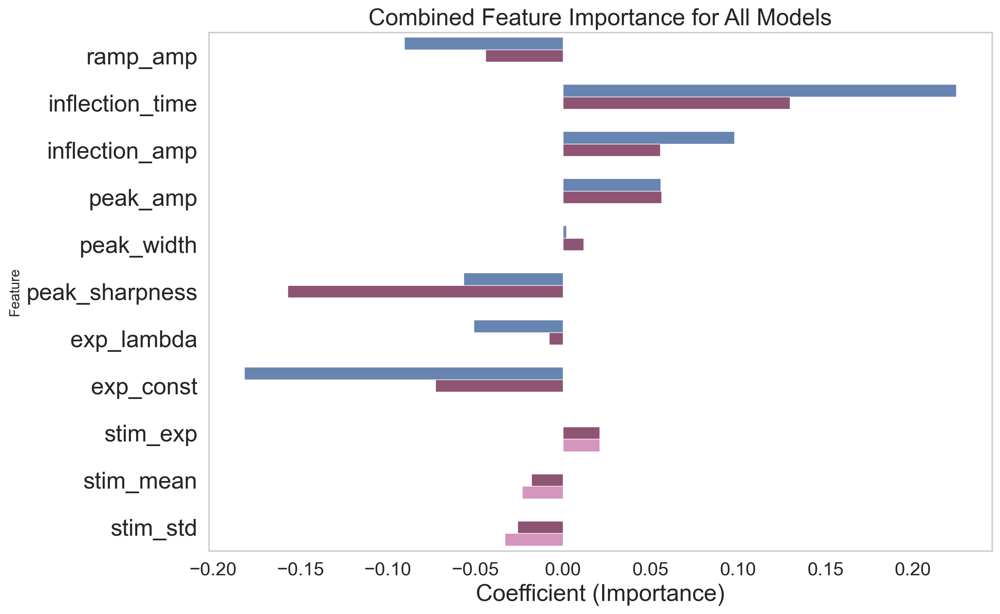

In [57]:
#Plot comparisons
plot_r2_comparison(ridge_results_spike_only, ridge_results_spike_stim, ridge_results_stim_only)
plot_combined_actual_vs_predicted(y_log_isi, ridge_results_spike_only['y_pred_cv'], ridge_results_spike_stim['y_pred_cv'], ridge_results_stim_only['y_pred_cv'])
plot_combined_feature_importance(feature_importance_spike_only_df, feature_importance_spike_stim_df, feature_importance_stim_only_df)


### F test to compare models

In [58]:
adjs_rsq_spk = ridge_results_spike_only["r2_mean"]
adjs_rsq_stim =ridge_results_stim_only["r2_mean"]
adjs_rsq_spk_stim =ridge_results_spike_stim["r2_mean"]

In [59]:
import scipy.stats as stats

# Number of features
p_spk = 8
p_stim = 3
p_spk_stim = 11

# Sample size
n = 391

def f_test_r2(adj_r2_small, adj_r2_big, p_small, p_big, n):
    num = (adj_r2_big - adj_r2_small) / (p_big - p_small)
    denom = (1 - adj_r2_big) / (n - p_big - 1)
    F = num / denom
    df1 = p_big - p_small
    df2 = n - p_big - 1
    p = 1 - stats.f.cdf(F, df1, df2)
    return F, p

# Compare all pairs
f_spk_vs_stim = f_test_r2(adjs_rsq_stim, adjs_rsq_spk, p_stim, p_spk, n)
f_spk_vs_combined = f_test_r2(adjs_rsq_spk, adjs_rsq_spk_stim, p_spk, p_spk_stim, n)
f_stim_vs_combined = f_test_r2(adjs_rsq_stim,adjs_rsq_spk_stim, p_stim, p_spk_stim, n)

print("Spike vs. Stim:", f_spk_vs_stim)
print("Spike vs. Combined:", f_spk_vs_combined)
print("Stim vs. Combined:", f_stim_vs_combined)

Spike vs. Stim: (1.7539190091261798, 0.12145258599986497)
Spike vs. Combined: (8.582855133956437, 1.586044455736957e-05)
Stim vs. Combined: (4.3800500645904865, 4.459054205763202e-05)
